# Computer Vision - P4

### **Carefully read the file `README.md` as well as the following instructions before start coding.**

## Delivery

Up to **1 point out of 10** will be penalized if the following requirements are not fulfilled:

- Implemented code should be commented.

- The questions introduced in the exercises must be answered.

- Add title to the figures to explain what is displayed.

- Comments and answers need to be in **English**.

- The deliverable must be a file named **P4_Student1_Student2.zip** that includes:
    - The notebook P4_Student1_Student2.ipynb completed with the solutions to the exercises and their corresponding comments.

**Deadline (Campus Virtual): November 22th, 23:00 h** 

==============================================================================================
## Descriptors extraction for object detection, based on template matching, ORB, and HOG
==============================================================================================

The main topics of Laboratory 4 are:

    4.1) SSD and Normalized Cross-correlation for template matching

    4.2) HOG image descriptor for object (person) detection

    4.3) Recognition by correspondance, based on feature extraction (ORB)

In order to complete this practicum, the following concepts need to be understood: template matching, feature localization (Harris, Censure), feature descriptor (HOG,ORB, Sift) methods.

It is highly recommendable to structure the code in functions in order to reuse code for different tests and images and make it shorter and more readable. Specially the visualization commands should be encapsulated in separate functions.

## 1 Template matching

**1.1** Given the image 'einstein.png' and the template image 'eye.png', detect the location of the template in the image comparing the use of:
- SSD distance (hint: norm() in numpy.linalg).
- normalized cross-correlation (hint: match_template() of skimage.feature).

Don't forget to normalize the images (having pixel values between [0,1]) before comparing them.

In [1]:
#Auxiliar function
def showImage(figsize, images, titles):
    
    fig=plt.figure(figsize=figsize)

    for image in range(len(images)):
        fig.add_subplot(1,len(images), image+1)
        plt.title(titles[image])
        plt.imshow(images[image], cmap='gray')
        plt.axis('off')

    plt.show()

C:\Users\84543\anaconda3\lib\site-packages\scipy\__init__.py:138: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.4)
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion} is required for this version of "


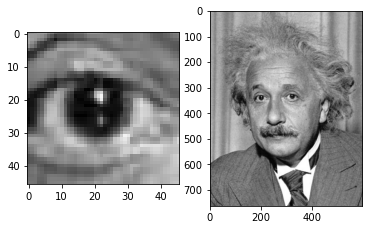

In [2]:
from skimage import io
from matplotlib import pyplot as plt
import numpy as np
from skimage import io, color, img_as_float, transform
from skimage.feature import match_template
%matplotlib inline

plt.subplot(1,2,1)
eye=io.imread('./images/eye.png')
plt.imshow(eye)

plt.subplot(1,2,2)
einstein=io.imread('./images/einstein.png')
plt.imshow(einstein)

plt.show()

Create a function for template matching applying SSD distance and normalized cross-correlation and display the results in the following format:
    
<img src="images_notebook/tm.png" width="400" height="120">

**Use titles in all figures to understand what is being displayed.**

In [3]:
# Your solution here
from skimage import img_as_float

def ssd(image, template, threshold):
    
    image, template = img_as_float(image), img_as_float(template)

    matchx = image.shape[0] - template.shape[0]
    matchy = image.shape[1] - template.shape[1]
    
    result = np.zeros((matchx, matchy))
    
    for i in range(matchx):
        for j in range(matchy):
            result[i][j] = np.linalg.norm(image[i:i + template.shape[0], j: j+template.shape[1]] - template)
    return [result, result<threshold]

In [4]:
def cross_correlation(image, template, threshold):
    
    image = img_as_float(image)
    template = img_as_float(template)
    
    result = match_template(image, template)
    
    return [result, result>threshold]

<ipython-input-5-f11cad59ccb0>:3: FutureWarning: Non RGB image conversion is now deprecated. For RGBA images, please use rgb2gray(rgba2rgb(rgb)) instead. In version 0.19, a ValueError will be raised if input image last dimension length is not 3.
  image_gray = color.rgb2gray(einstein)
<ipython-input-5-f11cad59ccb0>:4: FutureWarning: Non RGB image conversion is now deprecated. For RGBA images, please use rgb2gray(rgba2rgb(rgb)) instead. In version 0.19, a ValueError will be raised if input image last dimension length is not 3.
  template_gray = color.rgb2gray(eye)


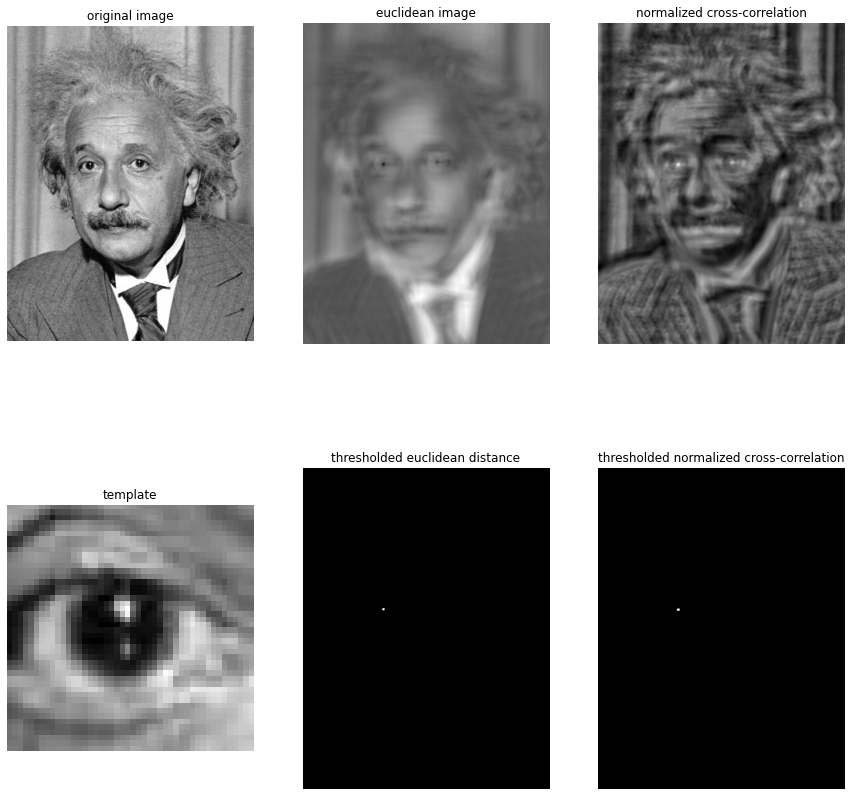

In [5]:
eye = io.imread('./images/eye.png')
einstein = io.imread('./images/einstein.png')
image_gray = color.rgb2gray(einstein)
template_gray = color.rgb2gray(eye)

imagesSSD = ssd(image_gray, template_gray, threshold=7)
imagesCR = cross_correlation(image_gray, template_gray, threshold=0.65)
images = [image_gray, imagesSSD[0], imagesCR[0], template_gray, imagesSSD[1], imagesCR[1]]
titles = ["original image", "euclidean image", "normalized cross-correlation",
          "template", "thresholded euclidean distance", "thresholded normalized cross-correlation"]
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(15,15))
for i in range(2):
    for j in range(3):
        ax = axs[i][j]
        if i == 1:
            j += 3
        ax.imshow(images[j], cmap='gray')
        ax.set_title(titles[j])
        ax.axis('off')
plt.show()

**1.2** How does the result of the template matching change if the image changes its contrast (for example if you make it clearer or darker)? 

Similarly to the previous case, please, visualize the euclidean distance and normalized cross-correlation images as well as the binarized (thresholded) images in the two cases.

**Note:** Use titles of the figures to explain what is displayed.


Read `einstein_br.png` and display the results on this image, using `eye.png` as template:

<ipython-input-6-e538fea482fd>:5: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  image_gray = color.rgb2gray(einstein)
<ipython-input-6-e538fea482fd>:6: FutureWarning: Non RGB image conversion is now deprecated. For RGBA images, please use rgb2gray(rgba2rgb(rgb)) instead. In version 0.19, a ValueError will be raised if input image last dimension length is not 3.
  template_gray = color.rgb2gray(eye)


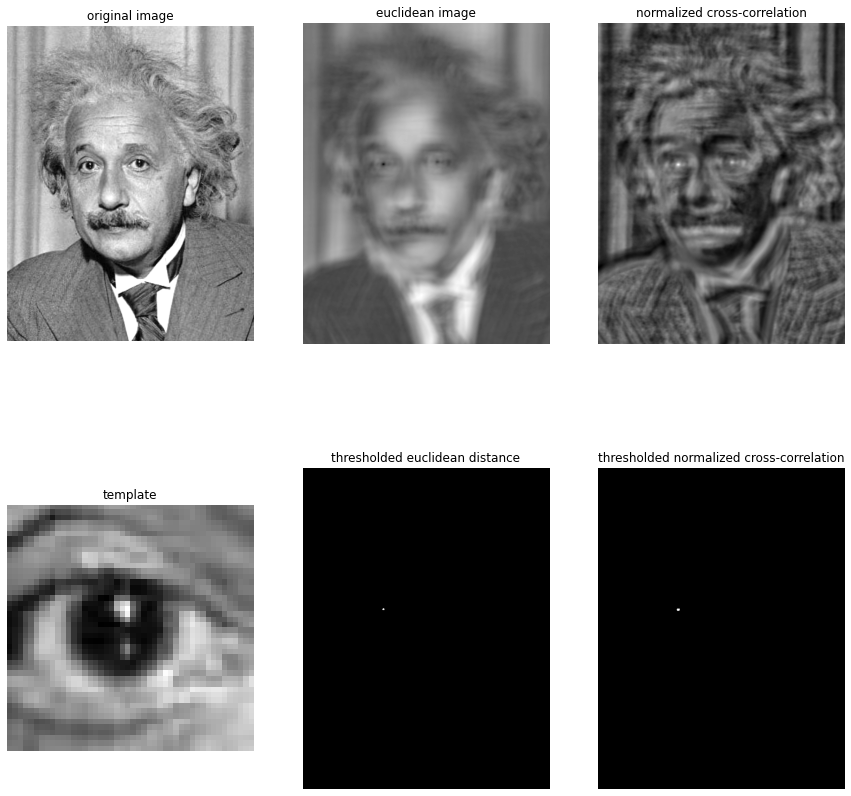

In [6]:
# Your solution here
#Einstein_br image
eye = io.imread('./images/eye.png')
einstein = io.imread('./images/einstein_br.png')
image_gray = color.rgb2gray(einstein)
template_gray = color.rgb2gray(eye)

imagesSSD = ssd(image_gray, template_gray, threshold=7)
imagesCR = cross_correlation(image_gray, template_gray, threshold=0.65)
images = [image_gray, imagesSSD[0], imagesCR[0], template_gray, imagesSSD[1], imagesCR[1]]
titles = ["original image", "euclidean image", "normalized cross-correlation",
          "template", "thresholded euclidean distance", "thresholded normalized cross-correlation"]
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(15,15))
for i in range(2):
    for j in range(3):
        ax = axs[i][j]
        if i == 1:
            j += 3
        ax.imshow(images[j], cmap='gray')
        ax.set_title(titles[j])
        ax.axis('off')
plt.show()

Print the minimum SSD and the maximum Normalized Cross-Correlation (NCC)

In [7]:
# Your solution here
print('Minimum SSD: ',imagesSSD[0].min())
print('Minimum NCC: ',imagesCR[0].min())

Minimum SSD:  3.0698531963845404
Minimum NCC:  -0.5212545689630322


**1.3** Read `einstein_mask.png` and display the results on this image, using the `eye.png` template:

<ipython-input-8-b8cc60ccb618>:5: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  image_gray = color.rgb2gray(einstein)
<ipython-input-8-b8cc60ccb618>:6: FutureWarning: Non RGB image conversion is now deprecated. For RGBA images, please use rgb2gray(rgba2rgb(rgb)) instead. In version 0.19, a ValueError will be raised if input image last dimension length is not 3.
  template_gray = color.rgb2gray(eye)


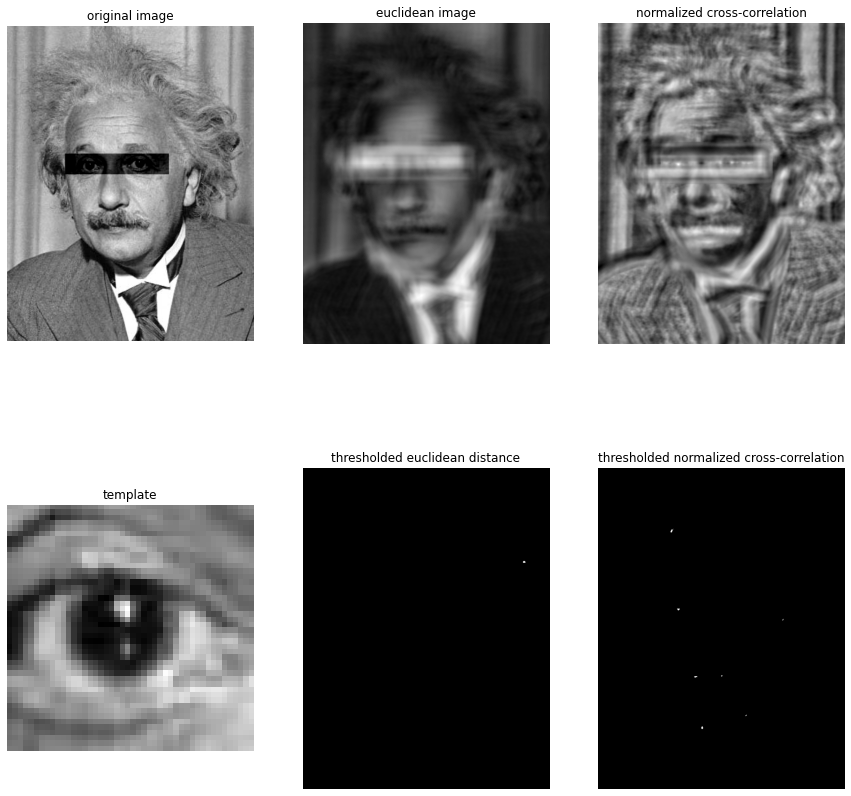

In [8]:
# Your solution here
# Einstein_mask
eye = io.imread('./images/eye.png')
einstein = io.imread('./images/einstein_mask.png')
image_gray = color.rgb2gray(einstein)
template_gray = color.rgb2gray(eye)

imagesSSD = ssd(image_gray, template_gray, threshold=8.5)
imagesCR = cross_correlation(image_gray, template_gray, threshold=0.5)
images = [image_gray, imagesSSD[0], imagesCR[0], template_gray, imagesSSD[1], imagesCR[1]]
titles = ["original image", "euclidean image", "normalized cross-correlation",
          "template", "thresholded euclidean distance", "thresholded normalized cross-correlation"]
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(15,15))
for i in range(2):
    for j in range(3):
        ax = axs[i][j]
        if i == 1:
            j += 3
        ax.imshow(images[j], cmap='gray')
        ax.set_title(titles[j])
        ax.axis('off')
plt.show()

Print the minimum SSD and the maximum NCC

In [9]:
# Your solution here
print('Minimum SSD: ',imagesSSD[0].min())
print('Minimum NCC: ',imagesCR[0].min())

Minimum SSD:  8.272637089446572
Minimum NCC:  -0.5212545112767212


What are the distances between the template and the image around the eyes of the image? 

In [10]:
# Your solution here

The distances between the template and the image around the eyes are more or less '0.0' because our template has matched with image.

Comment the template matching process:
* Is the algorithms affected by contrast changes in the image?
* How do metrics (i.e. minimum euclidean distance and maximum NCC) change in all previous cases? Is there a big difference among these values?
* What parameters it has and which measure for image comparisons works better.

In [10]:
# Your solution here


1)When we put a template with contrast changes, for example, a brighter template,
#we notice that euclidean distance method doesn't return any detection. 
#Instead, the normalized cross-correlation keeps returning the detection

2)The SSD value went up from 3 to 8 but the NCC only increased a bit, we could even say it didn't had any changes.
#From the SSD there's quite a big difference between those two values but as for the NCC we could say there's no difference.

**1.4** How does the result of the template matching change if instead the template is the one that changes its contrast (for example if you make it clearer or darker)? To this purpose, use the `eye_br.png` template.

<ipython-input-11-2a34a4fc50ae>:4: FutureWarning: Non RGB image conversion is now deprecated. For RGBA images, please use rgb2gray(rgba2rgb(rgb)) instead. In version 0.19, a ValueError will be raised if input image last dimension length is not 3.
  image_gray = color.rgb2gray(einstein)
<ipython-input-11-2a34a4fc50ae>:5: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  template_gray = color.rgb2gray(eye)


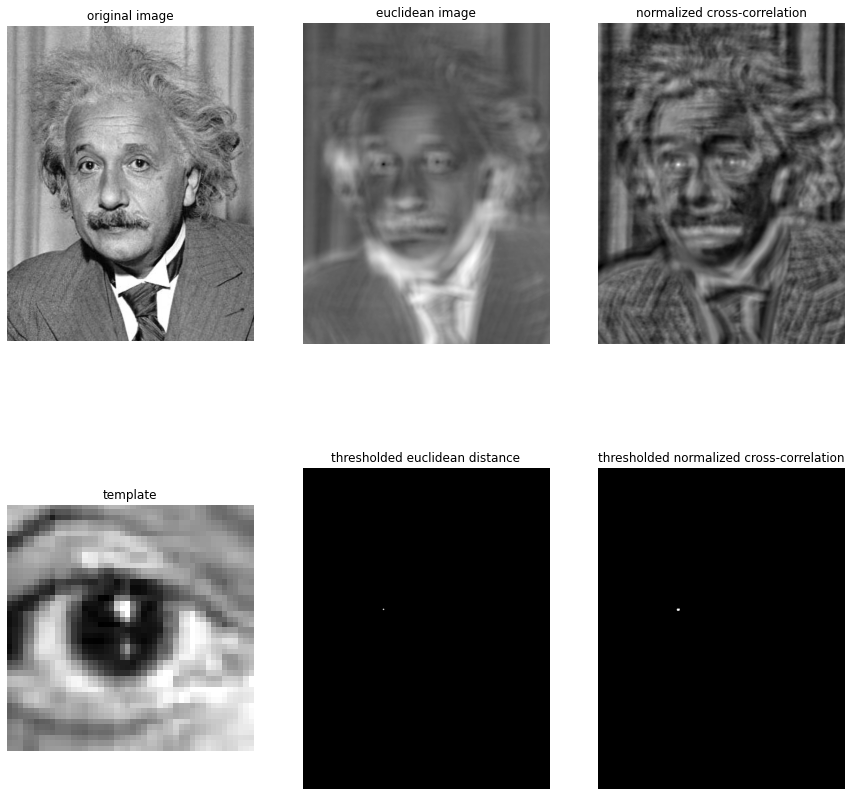

In [11]:
# Your solution here
eye = io.imread('./images/eye_br.png')
einstein = io.imread('./images/einstein.png')
image_gray = color.rgb2gray(einstein)
template_gray = color.rgb2gray(eye)

imagesSSD = ssd(image_gray, template_gray, threshold=7)
imagesCR = cross_correlation(image_gray, template_gray, threshold=0.65)
images = [image_gray, imagesSSD[0], imagesCR[0], template_gray, imagesSSD[1], imagesCR[1]]
titles = ["original image", "euclidean image", "normalized cross-correlation",
          "template", "thresholded euclidean distance", "thresholded normalized cross-correlation"]
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(15,15))
for i in range(2):
    for j in range(3):
        ax = axs[i][j]
        if i == 1:
            j += 3
        ax.imshow(images[j], cmap='gray')
        ax.set_title(titles[j])
        ax.axis('off')
plt.show()

Check how the result changes if the template is rotated.

Visualize the template and its rotation by 2º, 5º, 10º, 15º and 20º. Obtain again the template matching using the Euclidean distance and normalized cross-correlation.

**Help:** use the function rotate() in skimage.transform

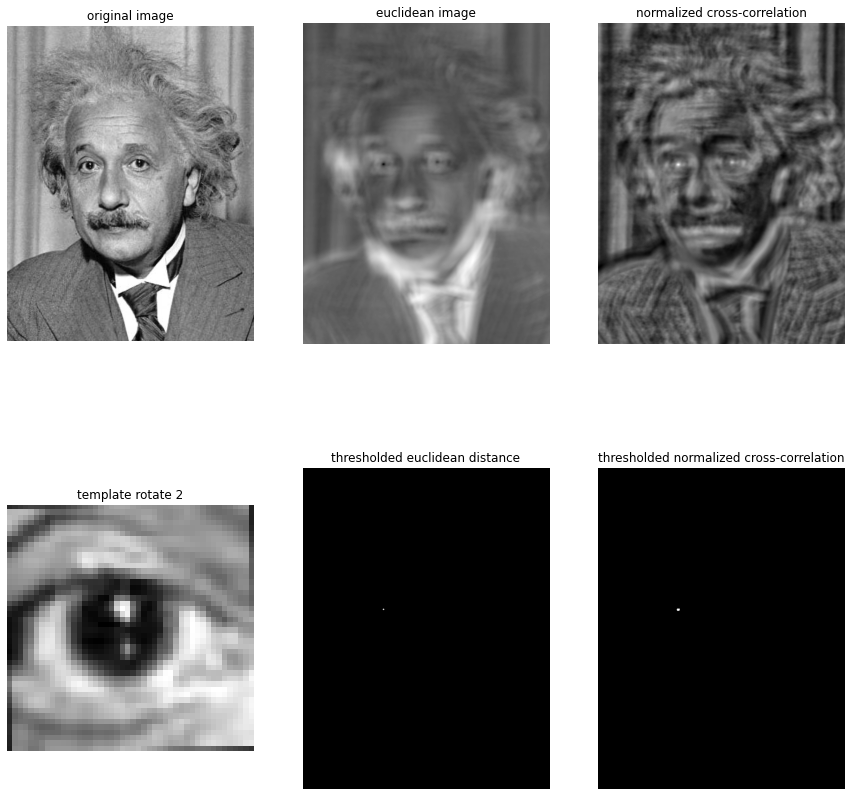

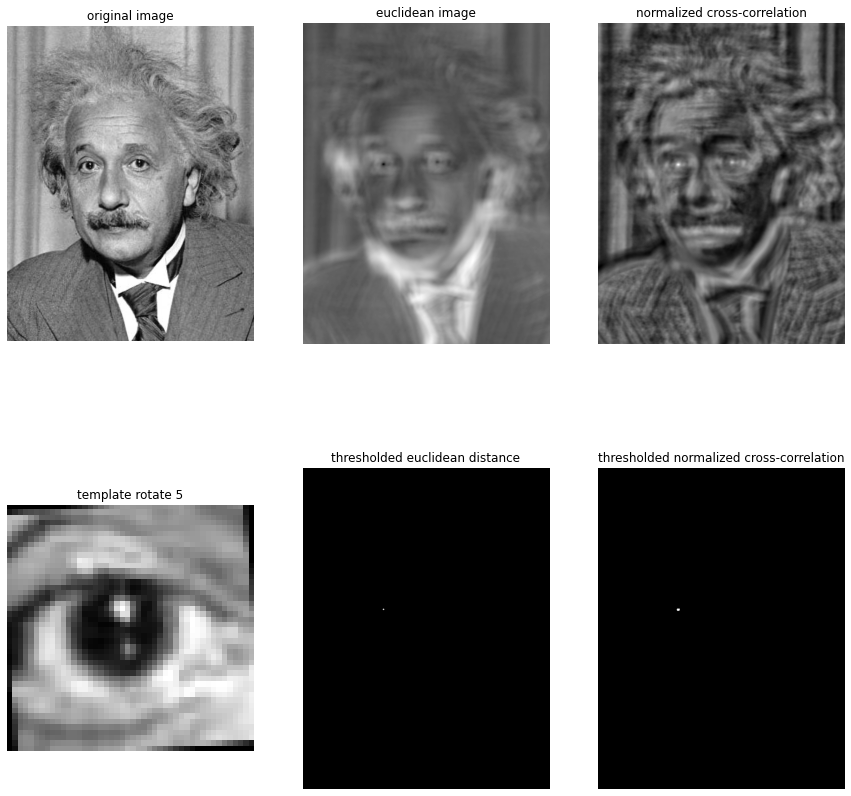

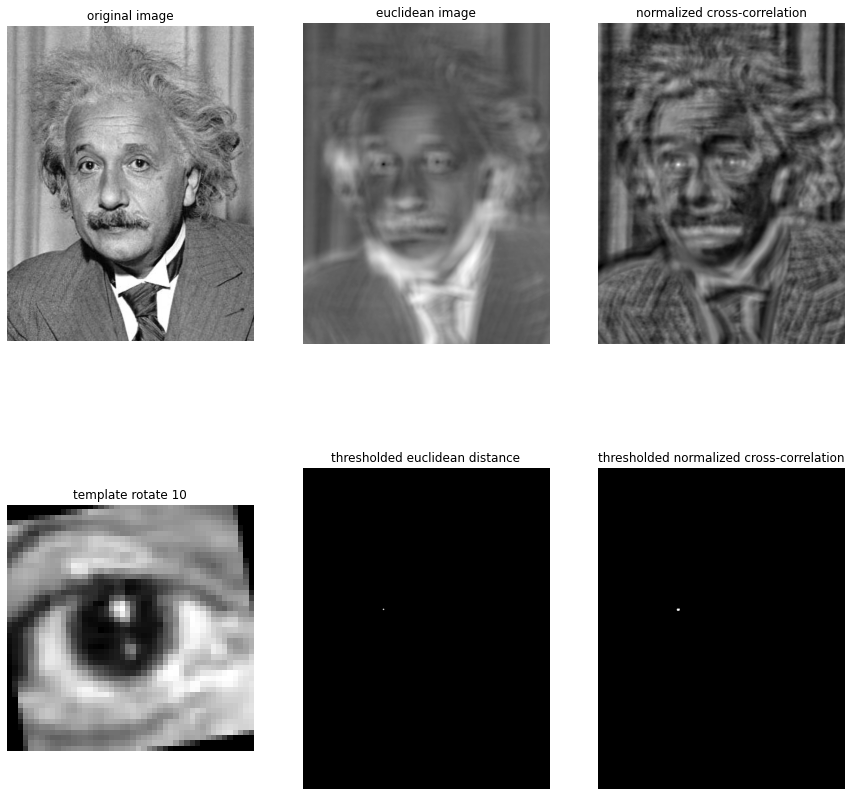

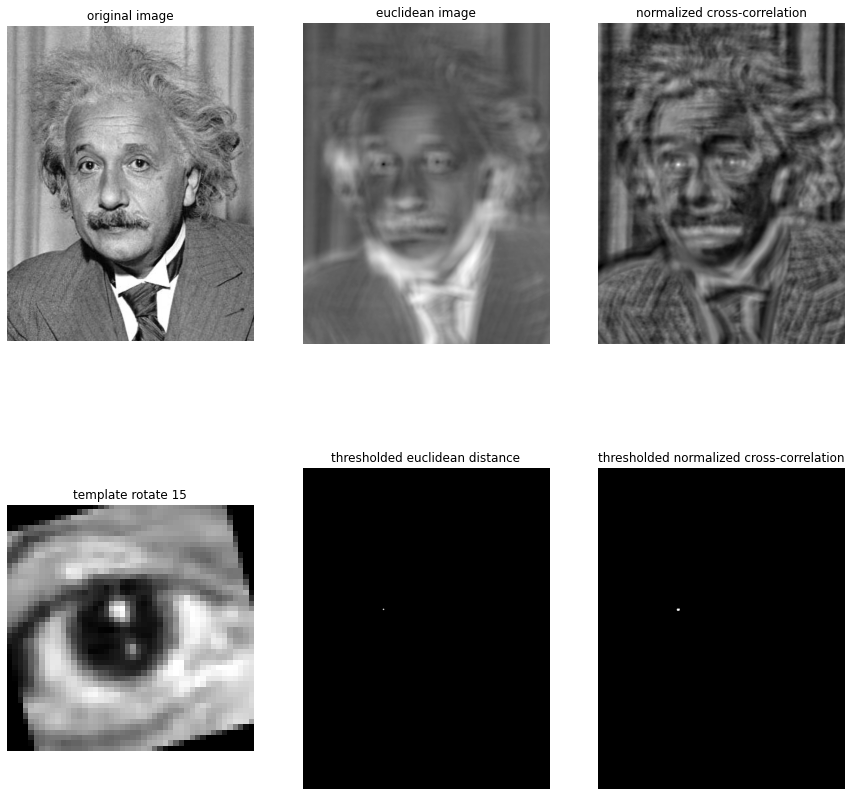

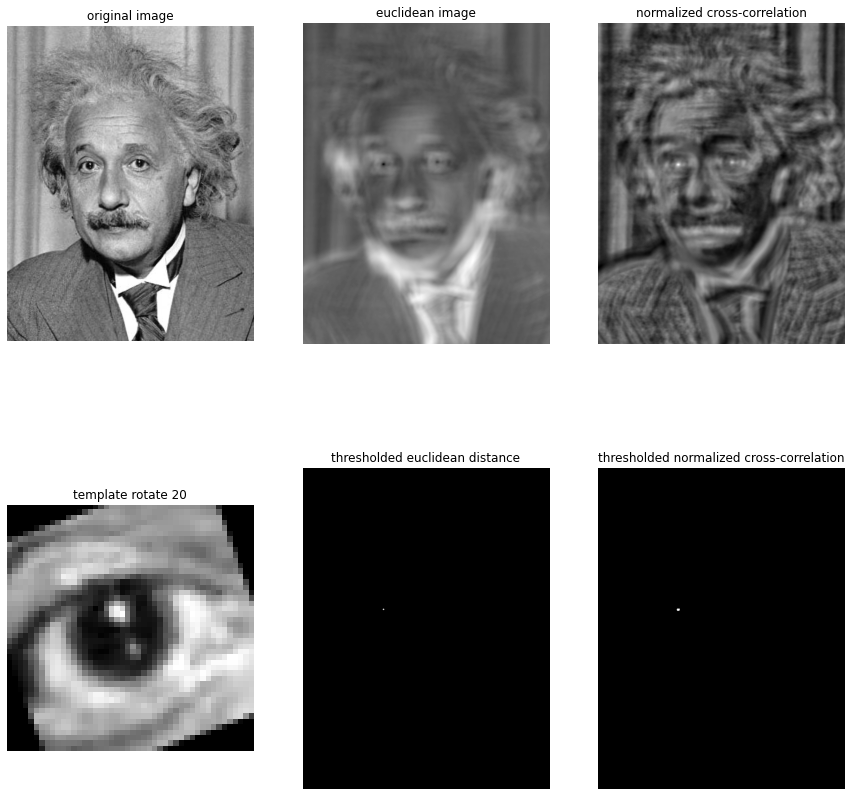

In [13]:
# Your solution here
for i in (2,5,10,15,20):
    rotated_template = transform.rotate(template_gray, i)
    imagesSSD = ssd(image_gray, template_gray, threshold=7)
    imagesCR = cross_correlation(image_gray, template_gray, threshold=0.65)
    images = [image_gray, imagesSSD[0], imagesCR[0], rotated_template, imagesSSD[1], imagesCR[1]]
    titles = ["original image", "euclidean image", "normalized cross-correlation",
              "template rotate " + str(i), "thresholded euclidean distance", "thresholded normalized cross-correlation"]
    fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(15,15))
    for i in range(2):
        for j in range(3):
            ax = axs[i][j]
            if i == 1:
                j += 3
            ax.imshow(images[j], cmap='gray')
            ax.set_title(titles[j])
            ax.axis('off')
    plt.show()

Comment the template matching process:
* Please, explain briefly the algorithm, including advantages and disadvantage
* Is the algorithms affected by contrast changes in the tempate image?
* What parameters it has and which measure for image comparisons works better.

In [14]:
# Your solution here

The algorithm consists in finding "template image" in original image. This process requieres finding the distance by slicing the size of template over original image.

Exist two methods to find it: euclidean distance and cross_correlation.

Advantages: It is very useful to find a template in an image where the contrast and the ilumnation has changed (contrast & illumination invariant). Disadvantages: It is very sensible to the image changes in scale and rotation (scale & rotation variant).

This means that the perfect parameters for comparisons would be having the template in the same scale/rotation as original image. Otherwise, more false positives will appear. It is important to clarify that we have to adapt our threshold so that we can find our results in the best way.

# 2 Histogram of Oriented Gradients

In this section we will treat the following topic: HOG image descriptor. Application to person detection.

The Histogram of Oriented Gradients (HOG) feature descriptor is classical image descriptor for object detection.

Given the image `person_template.bmp` and the folder `/images/TestPersonImages/`, apply the HOG descriptor in order to detect where there is a person in the images. To this purpose, apply the "sliding window" technique. We use images from GRAZ 01 data from [INRIA datasets](http://pascal.inrialpes.fr/data/human/).

**2.1.** Read the template (`person_template.bmp`), obtain its HOG descriptor (with the optimal parameters) and visualize it.

Help: the HOG detector function is in the skimage.feature library ([Help](http://scikit-image.org/docs/dev/auto_examples/features_detection/plot_hog.html#sphx-glr-auto-examples-features-detection-plot-hog-py)).

In [12]:
def getHOG(image):
    img = image.copy()
    img_gray = color.rgb2gray(img)
    img_gray_f = img_as_float(img_gray)
    
    fd,hogImage = hog(img_gray_f, orientations=8, pixels_per_cell=(4, 4),
                    cells_per_block=(3, 3), visualize=True)
    return hogImage

<ipython-input-13-0b5976ac8792>:5: FutureWarning: Non RGB image conversion is now deprecated. For RGBA images, please use rgb2gray(rgba2rgb(rgb)) instead. In version 0.19, a ValueError will be raised if input image last dimension length is not 3.
  person = color.rgb2gray(person)
<ipython-input-12-0ee22541c4c5>:3: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  img_gray = color.rgb2gray(img)


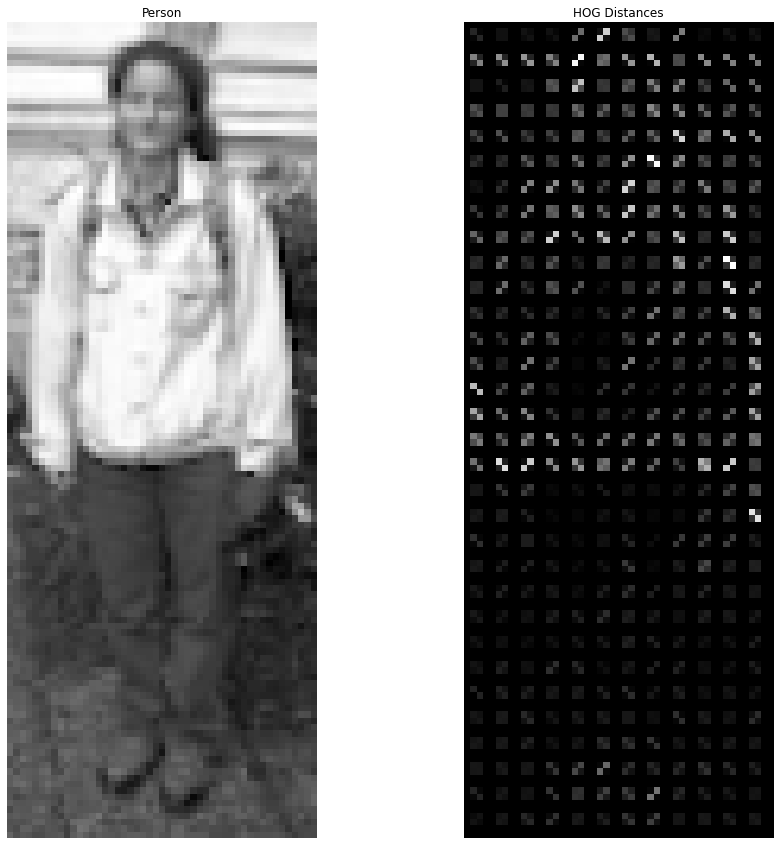

In [13]:
# Your solution here
from skimage.feature import hog
from skimage import data, exposure
person = io.imread('./images/person_template.bmp')
person = color.rgb2gray(person)
images = [person, getHOG(person)]
titles = ['Person', 'HOG Distances']

showImage((15,15), images, titles)

**2.2.** Apply the HOG descriptor on the complete set of images for person detection.

a) Read images from the folder "TestPersonImages", slide a window on each image, obtain the HOG descriptor and compare to the HOG descriptor of the person template. 

b) Visualize the location in the image that is the most similar to the person template using the distance between the template and test image descriptors.

Display the results of every person detection following this format:

<img src="images_notebook/hog.png" width="800" height="100">

In [19]:
# Your solution here
from queue import PriorityQueue
import matplotlib.patches as patches
def compare(template, image):
    
    hog_template = getHOG(template)
    
    matchx = image.shape[0]-template.shape[0]
    matchy = image.shape[1]-template.shape[1]

    result = getHOG(image)
    
    #PriorityQueue to know which will be our minimum distance
    pq = PriorityQueue()
    
    # Slicing with x of 5
    for i in range(0,matchx,5):
        for j in range(0,matchy,5):
            
            # Center for the result HOG to display
            posx = template.shape[0]+i-(int(template.shape[0]/2))
            posy = template.shape[1]+j-(int(template.shape[1]/2))
            
            # Get the region of the image to generate the HOG
            region = image[i:i+template.shape[0],j:j+template.shape[1]]
            hog_region = getHOG(region)
            hog_region_rescaled = exposure.rescale_intensity(hog_region, in_range=(0,20))
            
            # Do euclidean distance with HOG of our region and our template
            hog_distance = np.linalg.norm(hog_region_rescaled - hog_template)

            # Save the information into the PriorityQueue
            info = [i, j]
            pq.put((hog_distance, info))
                   
    # Get this min of our PQ  
    inf = pq.get()[1]
    minX = inf[0]
    minY = inf[1]

    # Generate two rectangles for the HOG and the original image
    rect1 = patches.Rectangle((minY,minX), template.shape[1], template.shape[0], edgecolor='r', facecolor='none')
    rect2 = patches.Rectangle((minY,minX), template.shape[1], template.shape[0], edgecolor='r', facecolor='none')

    representation, position = plt.subplots(ncols=3, figsize=(15,20))
    position[0].imshow(template, cmap='gray')
    position[0].set_title("Person template")
    position[1].imshow(image, cmap='gray')
    position[1].add_patch(rect1)
    position[1].set_title("Best Region Match")
    position[2].imshow(result, cmap='gray')
    position[2].set_title("HOG distances")
    position[2].add_patch(rect2)
    plt.show()

<ipython-input-20-88eb66b0e030>:3: FutureWarning: Non RGB image conversion is now deprecated. For RGBA images, please use rgb2gray(rgba2rgb(rgb)) instead. In version 0.19, a ValueError will be raised if input image last dimension length is not 3.
  person = color.rgb2gray(person)
<ipython-input-12-0ee22541c4c5>:3: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  img_gray = color.rgb2gray(img)


Imatge numero:  0


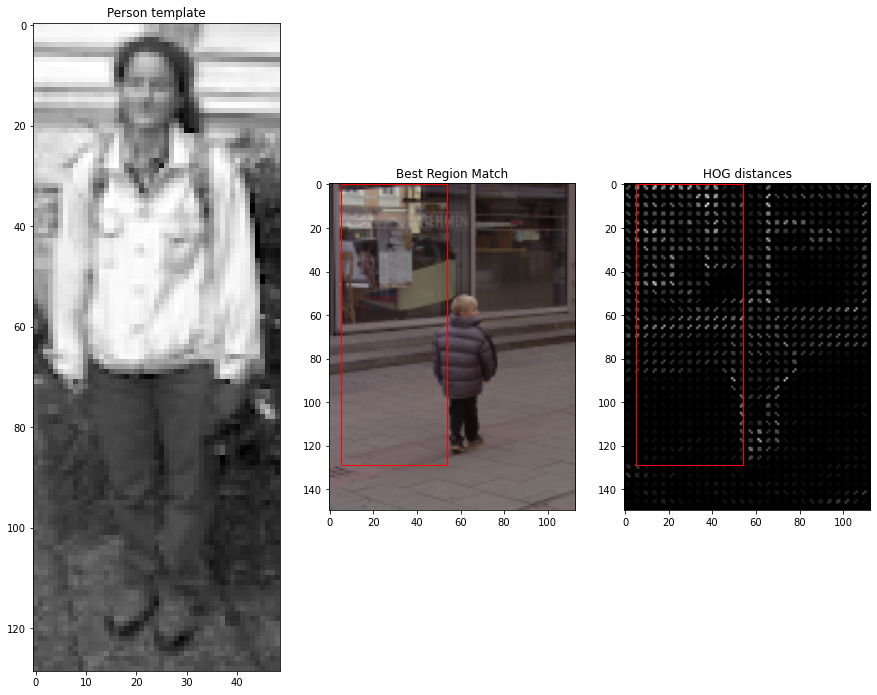

Imatge numero:  1


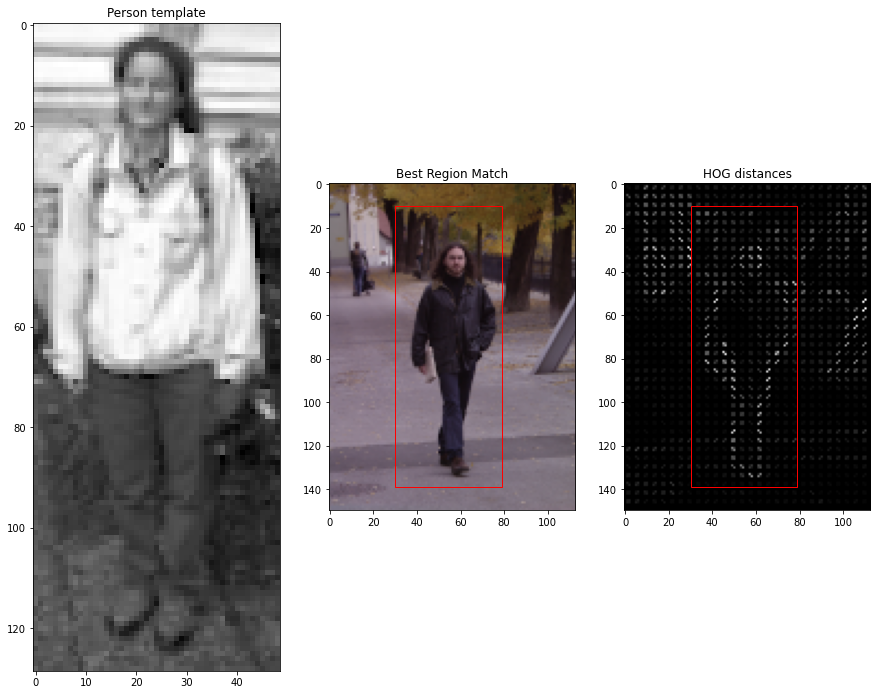

Imatge numero:  2


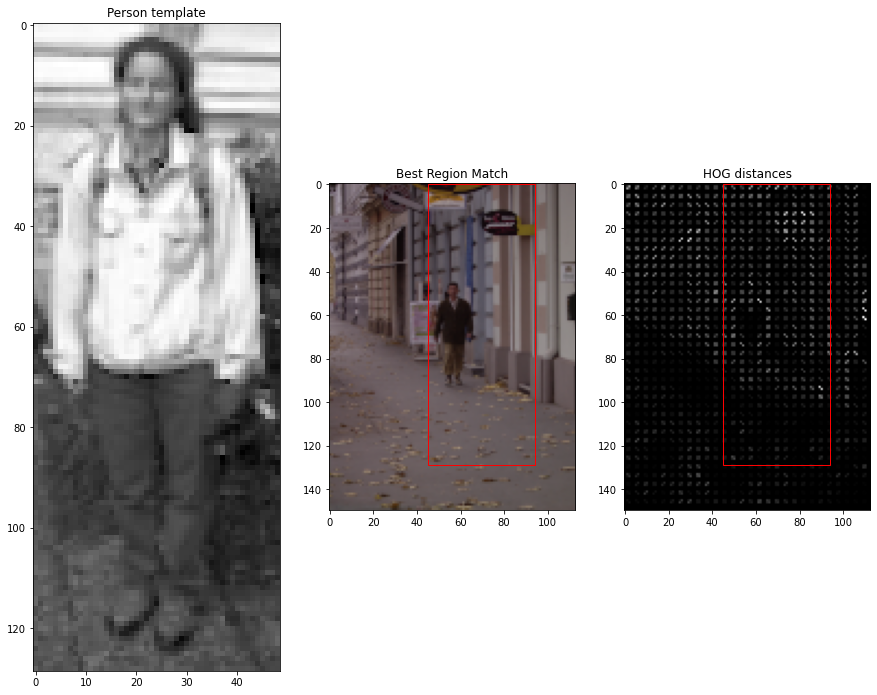

Imatge numero:  3


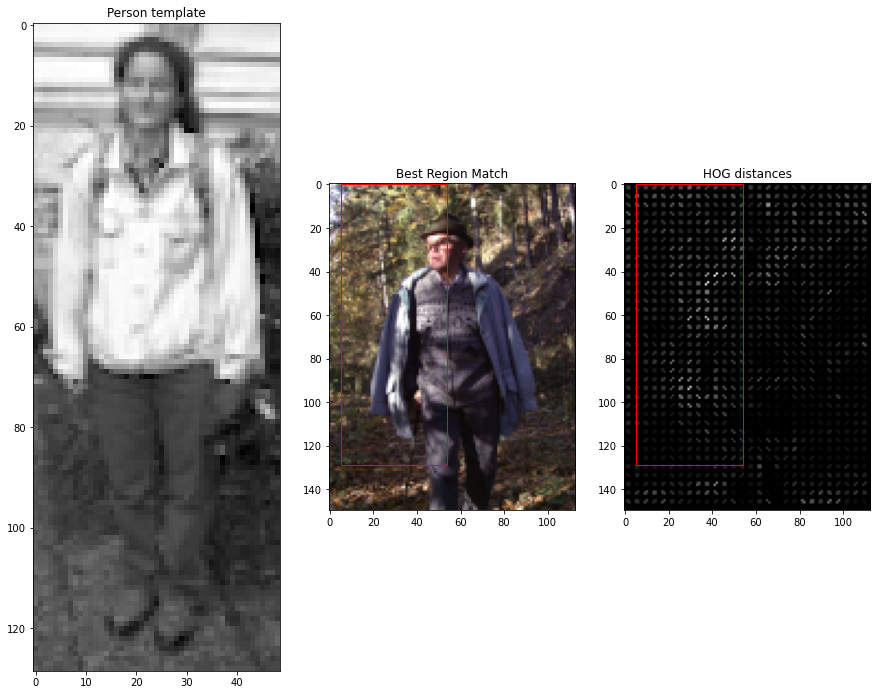

Imatge numero:  4


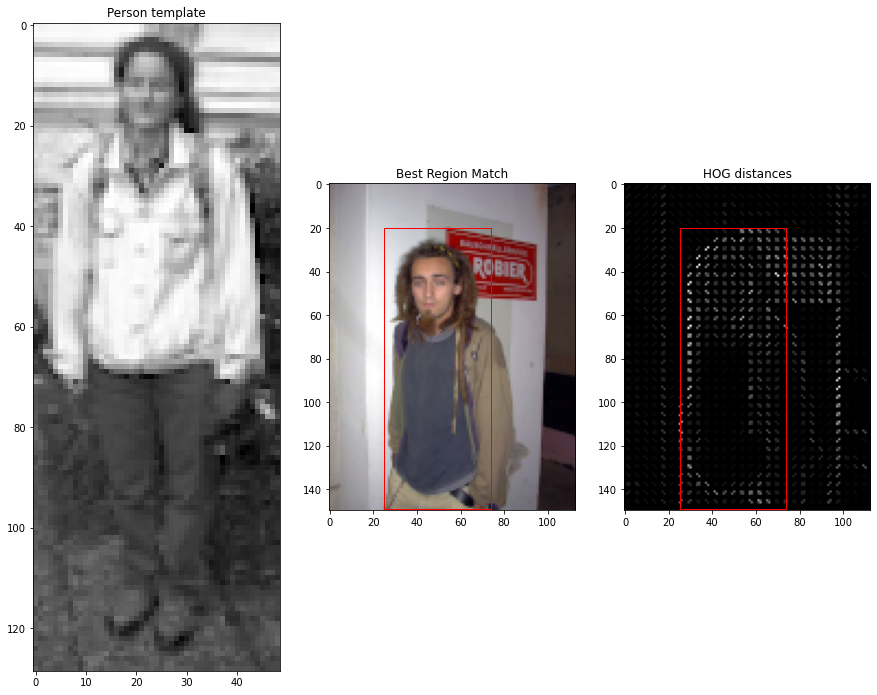

Imatge numero:  5


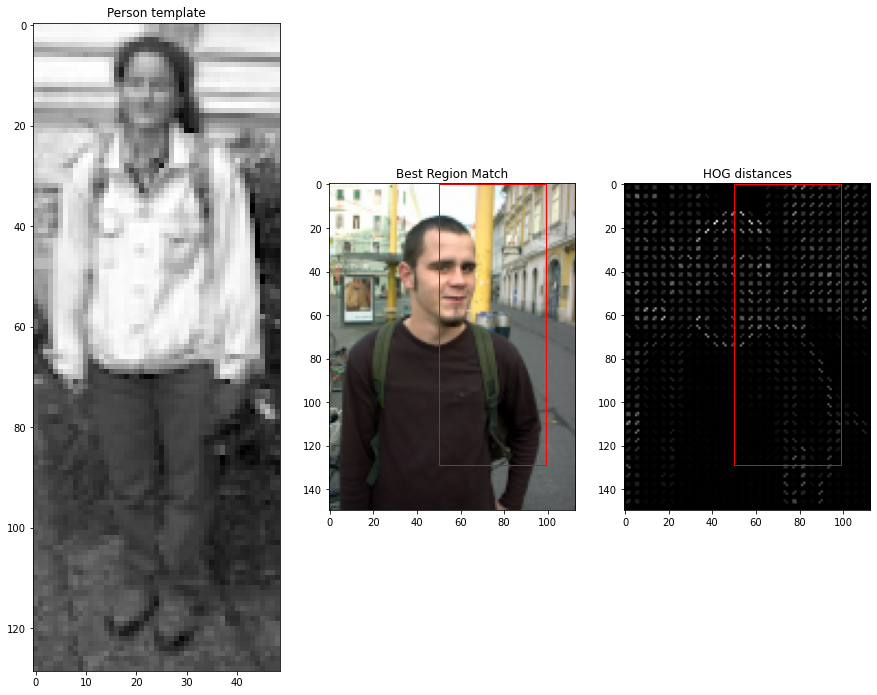

Imatge numero:  6


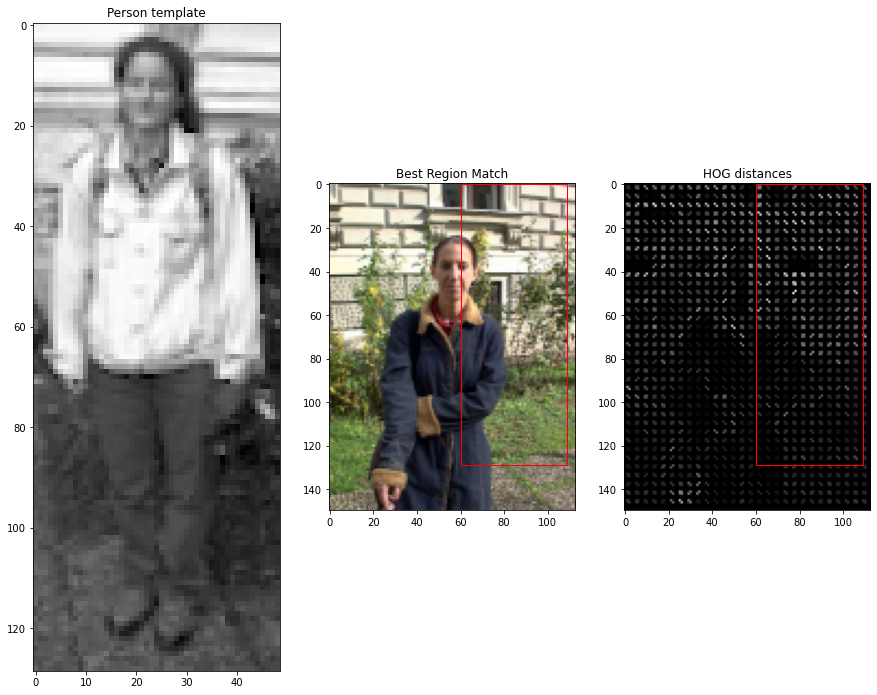

Imatge numero:  7


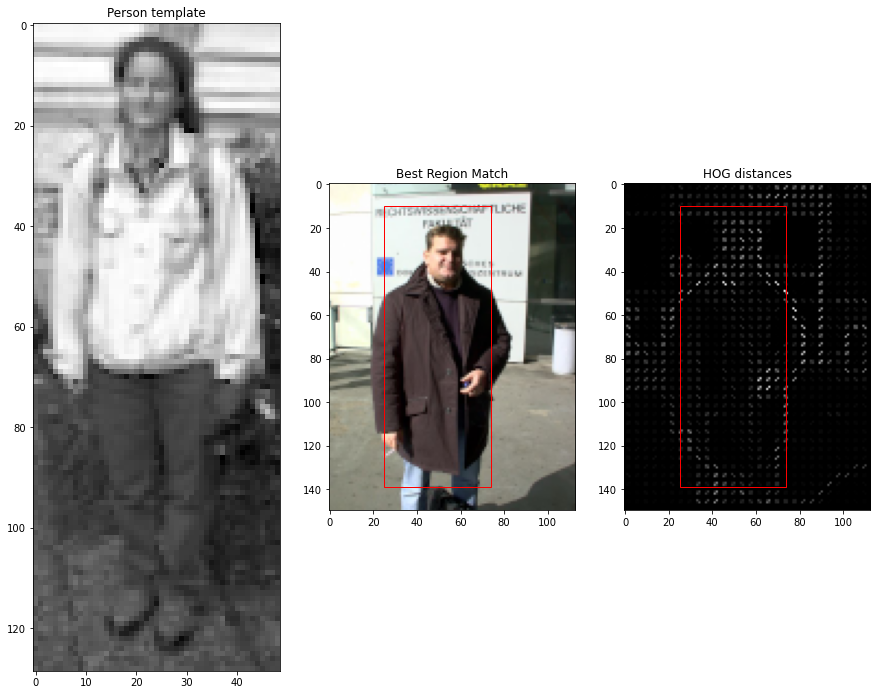

Imatge numero:  8


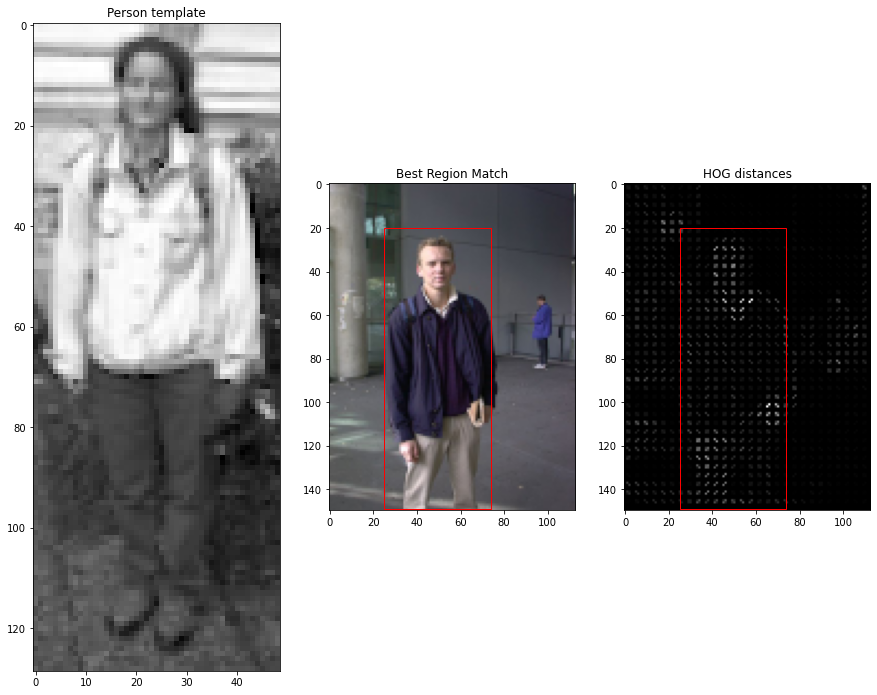

Imatge numero:  9


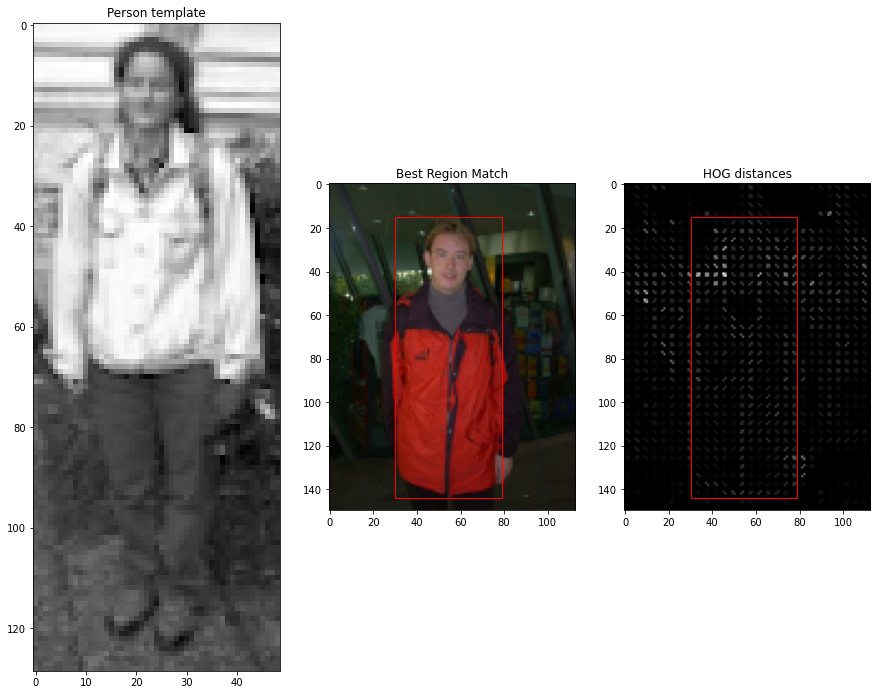

Imatge numero:  10


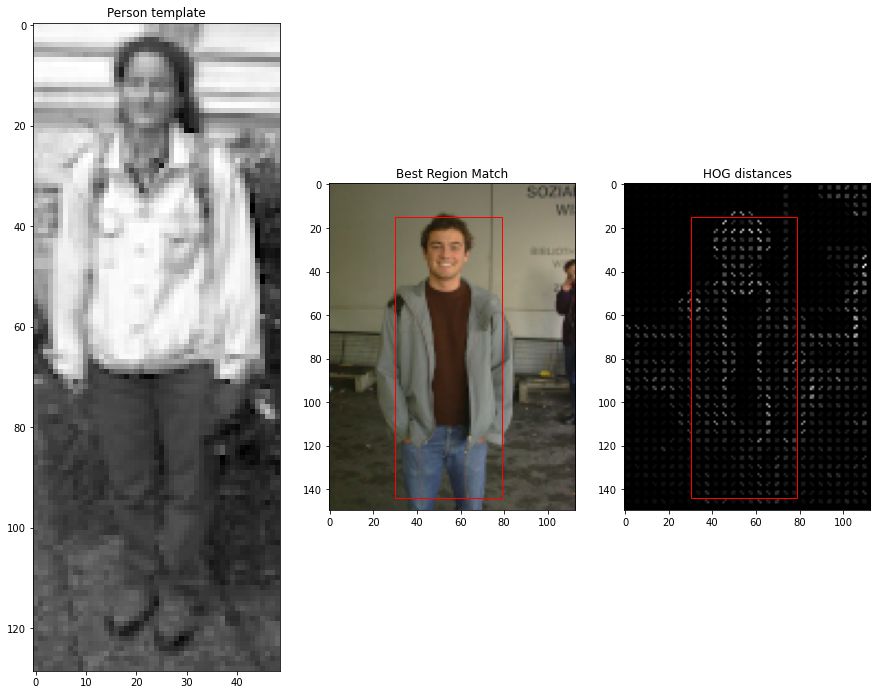

Imatge numero:  11


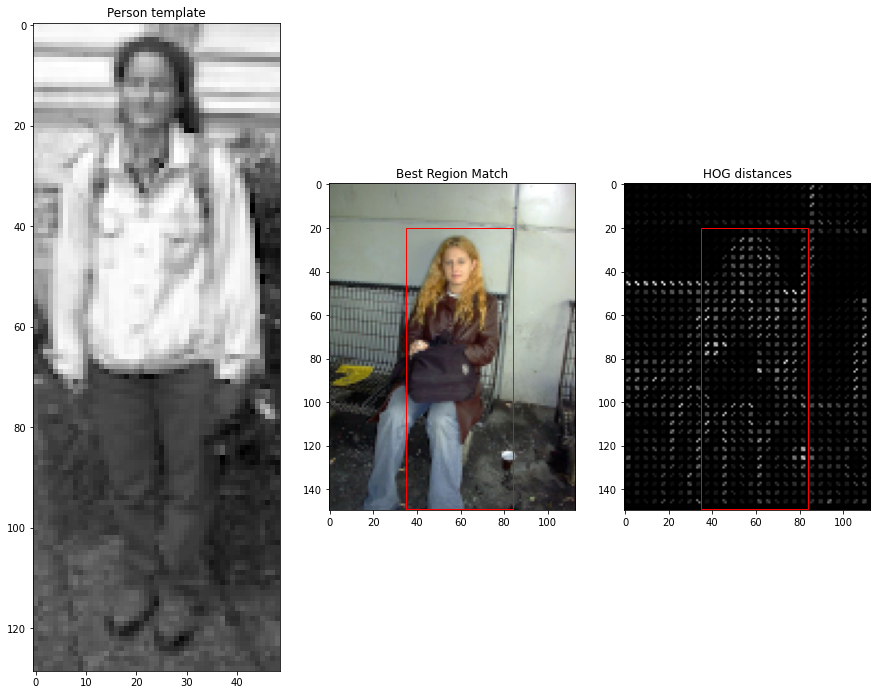

Imatge numero:  12


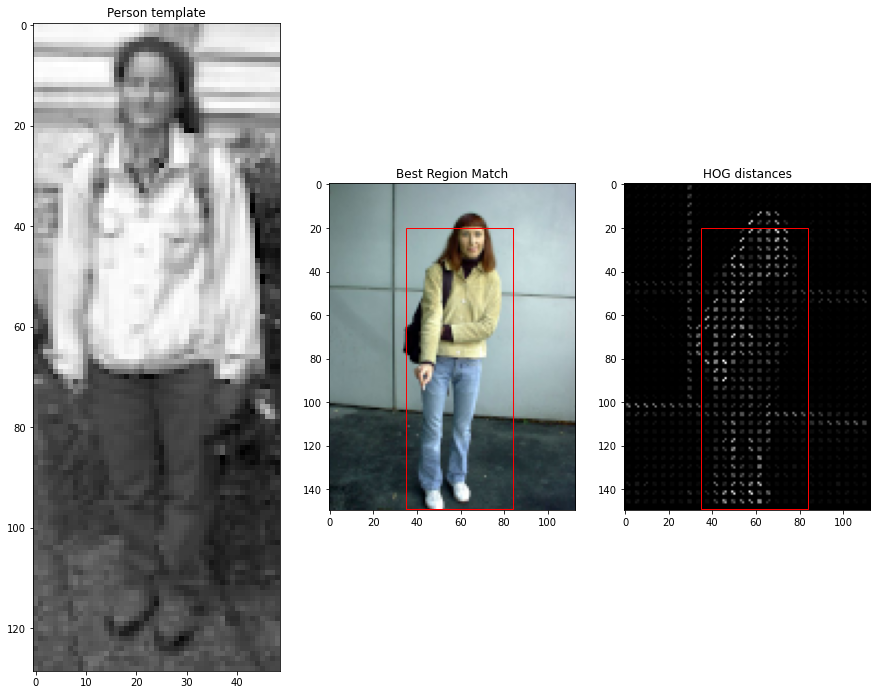

Imatge numero:  13


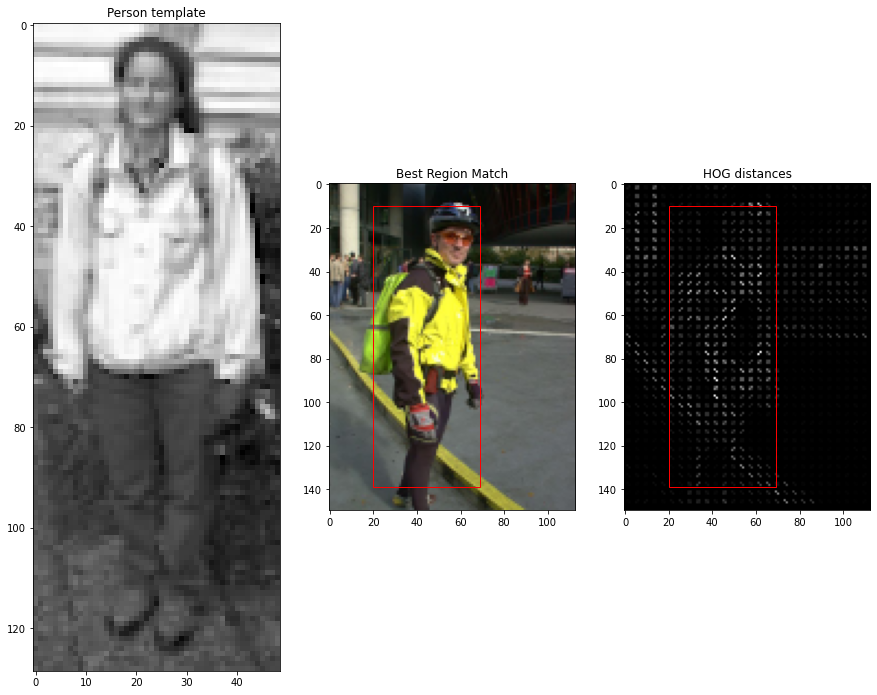

Imatge numero:  14


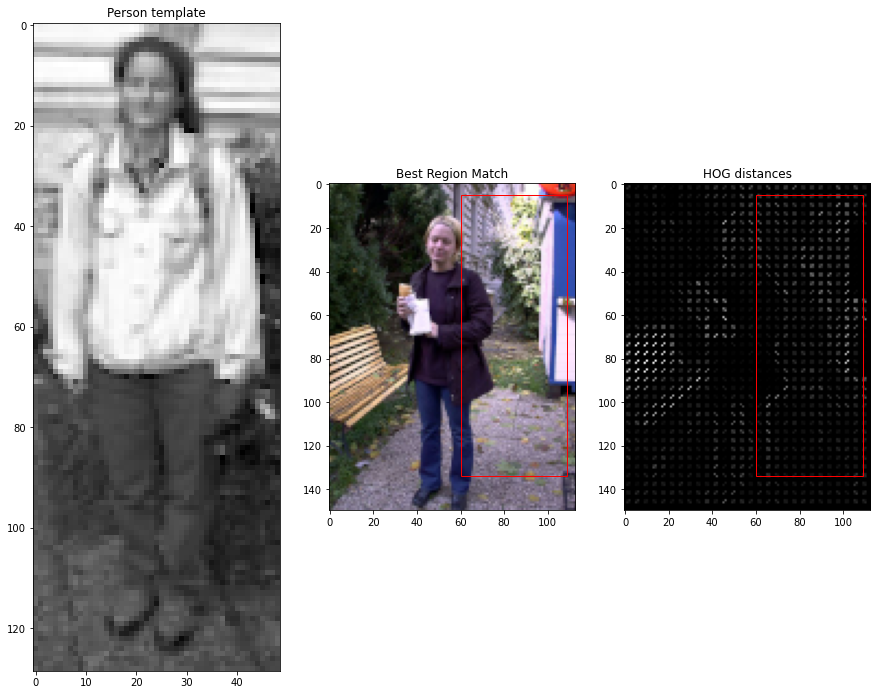

In [20]:
ic = io.ImageCollection('./images/TestPersonImages/*.bmp')
person = io.imread('./images/person_template.bmp')
person = color.rgb2gray(person)
for i,im in enumerate(ic):
    print("Imatge numero: ", i)
    compare(person, im)

What is the dimension of your HOG descriptor? Explain it.

In [90]:
# Your solution here

The dimensions of my HOG descriptor depends on the parameters and the image shape, since all the images have a shape of 150x113 and in our parameters we said pixels_per_cell=(4, 4), the descriptor have (150/4) * (113/4) cells and each result of the previous division, before the multiplication, divided into 3 to get the number of blocks, cells_per_block=(3, 3)

Count on how many images were the persons detected correctly and discuss the failures.
What do you think can be the reasons for the failures?

In [ ]:
# Your solution here

The algorithm can find 10 correct coincidences in a total of 14 person images. Some of them are nearly coincidences, but not correct position detection since the detector didn't take a part of the clothes but it took the person. In our opinion, the failures can be due to the fact that the images are obstacled by some other objects or the similarity between the template person and the image for comparison is low.

Test several values of the parameters (``orientations``, ``pixels_per_cell``, ``cells_per_block``) to show which are the optimal values for the person detection problem.

<ipython-input-91-1f5a88f245b2>:12: FutureWarning: Non RGB image conversion is now deprecated. For RGBA images, please use rgb2gray(rgba2rgb(rgb)) instead. In version 0.19, a ValueError will be raised if input image last dimension length is not 3.
  person = color.rgb2gray(person)
<ipython-input-91-1f5a88f245b2>:4: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  img_gray = color.rgb2gray(img)


Imatge numero:  0


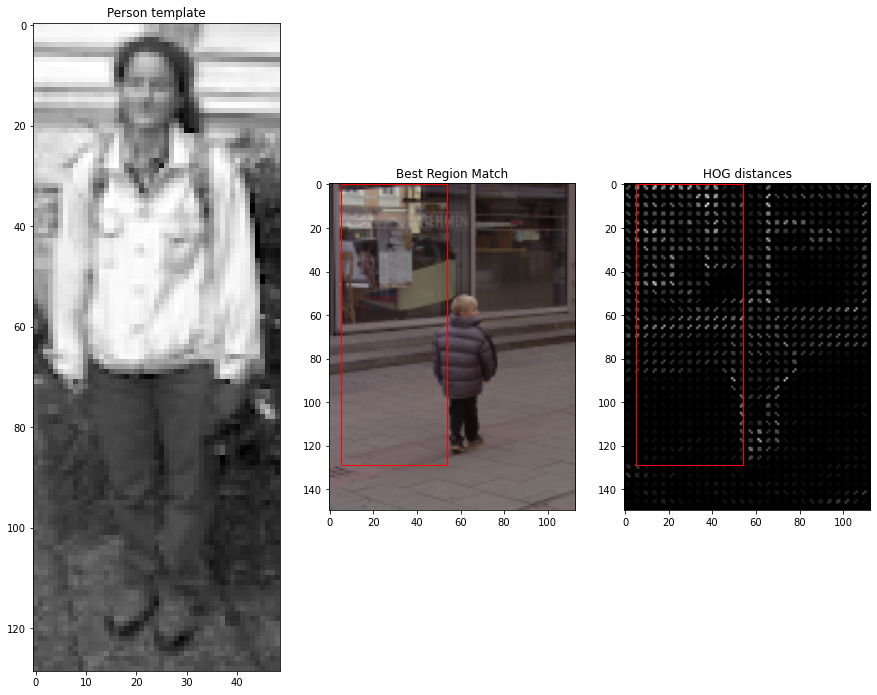

Imatge numero:  1


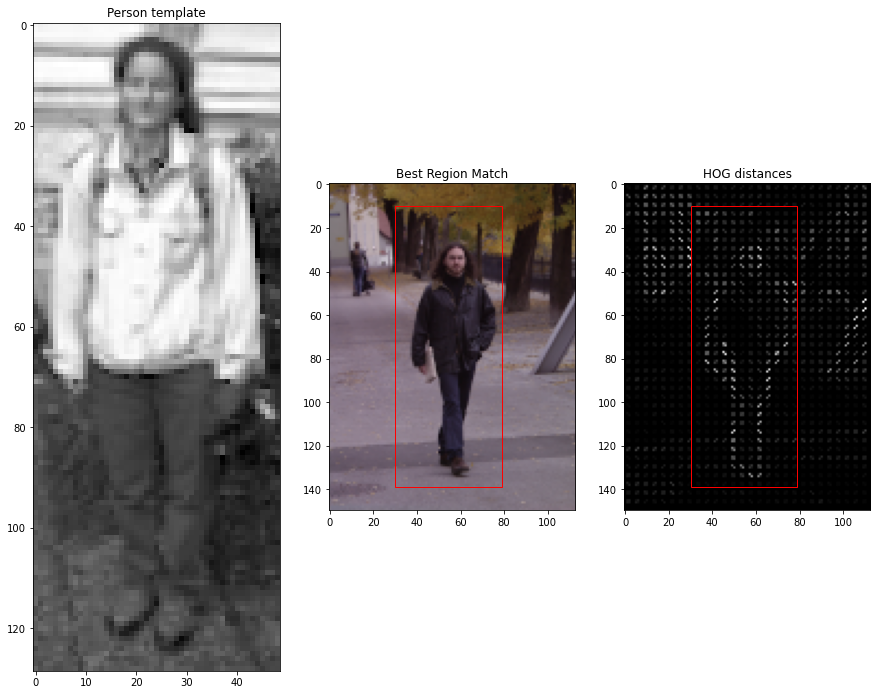

Imatge numero:  2


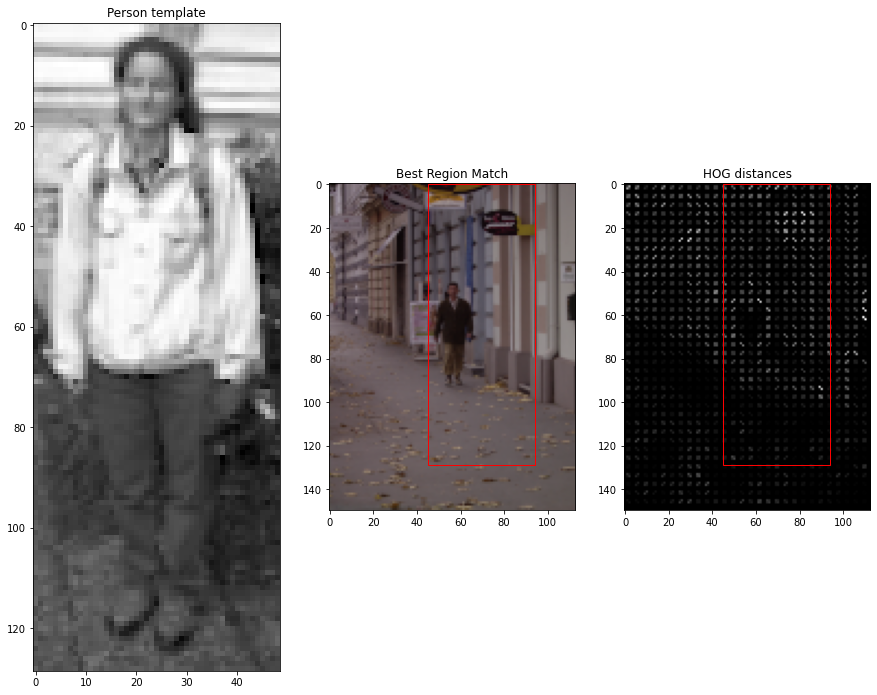

Imatge numero:  3


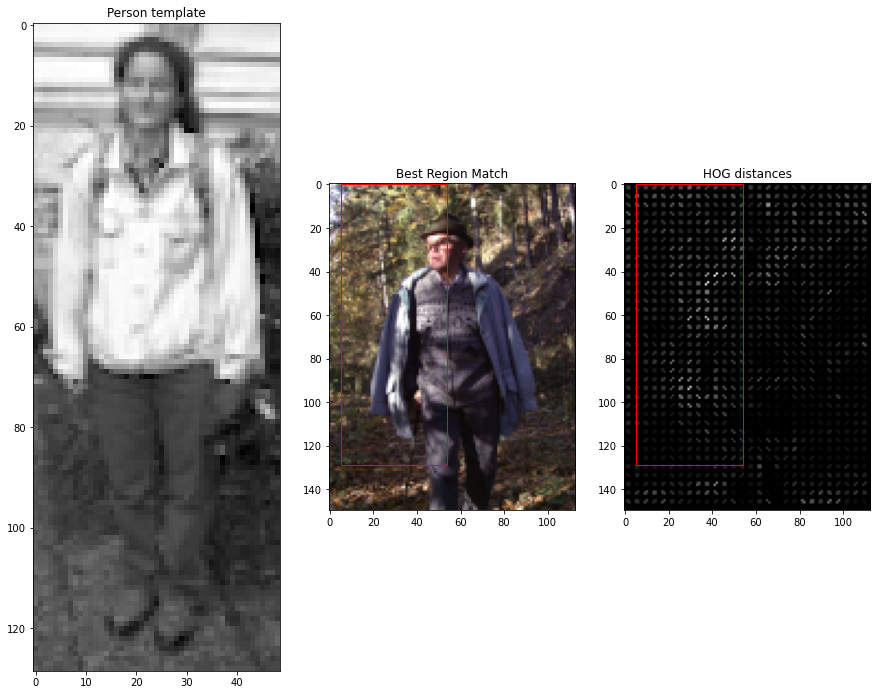

Imatge numero:  4


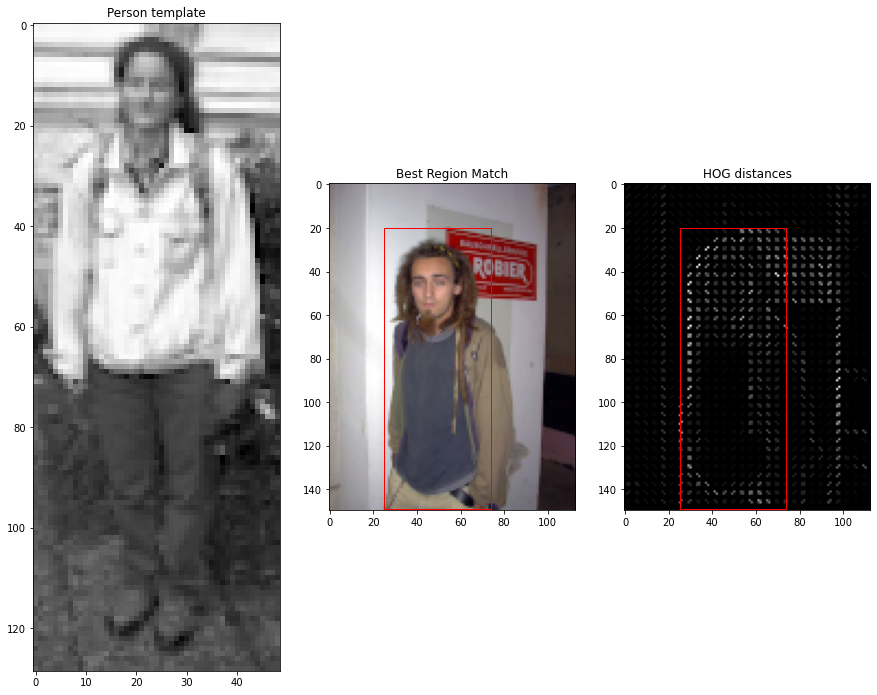

Imatge numero:  5


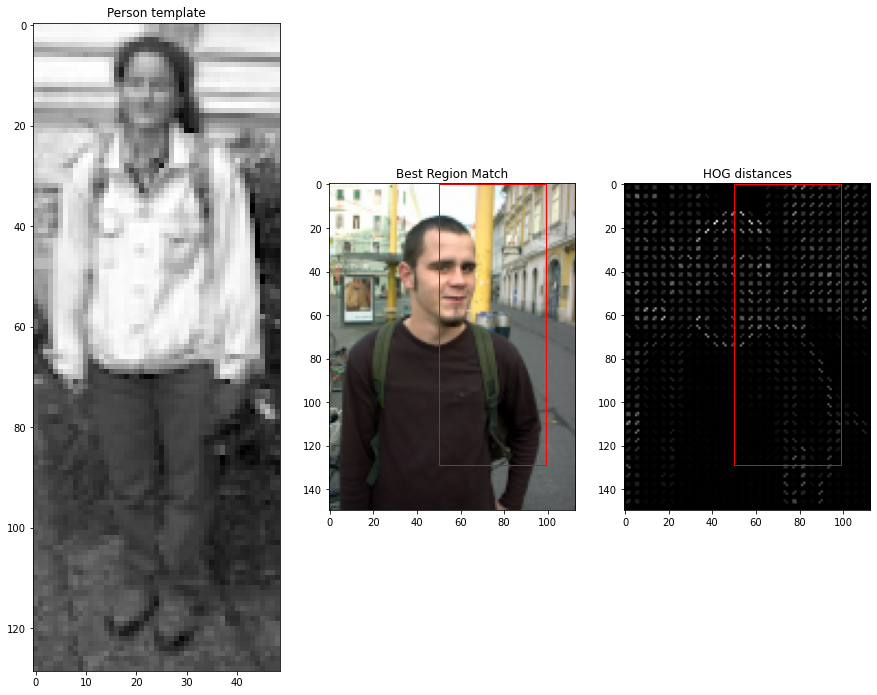

Imatge numero:  6


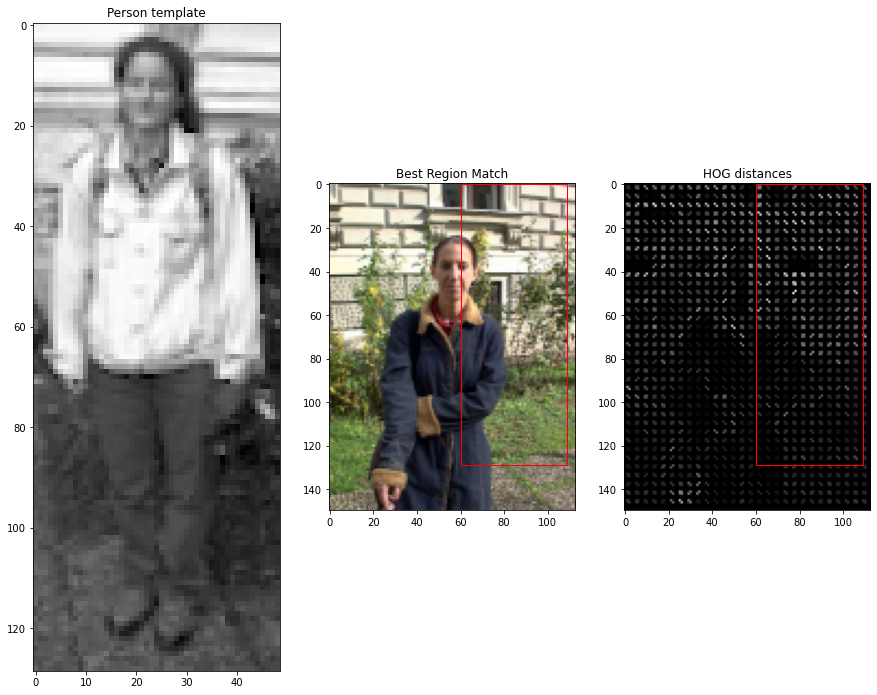

Imatge numero:  7


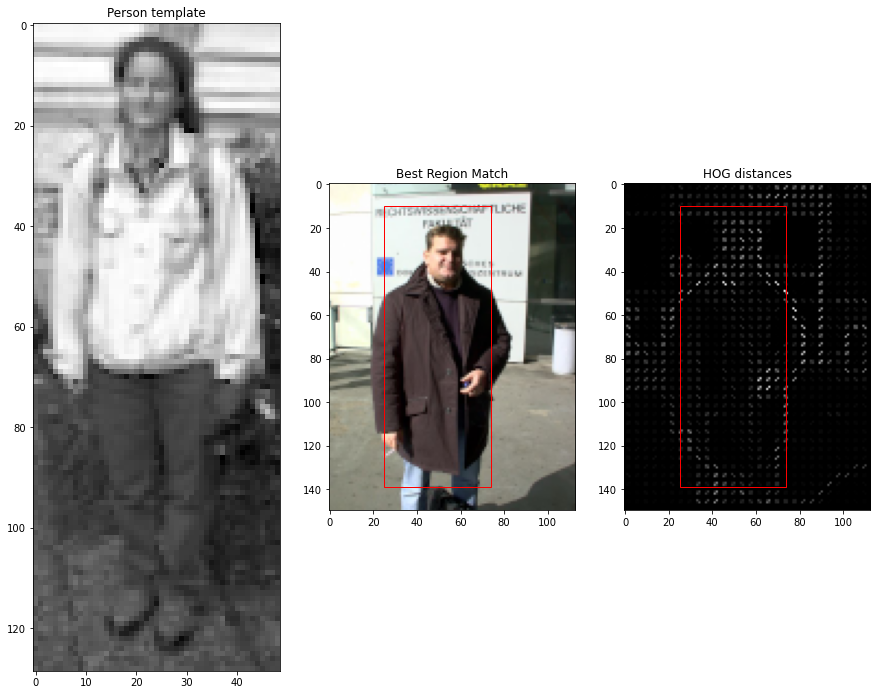

Imatge numero:  8


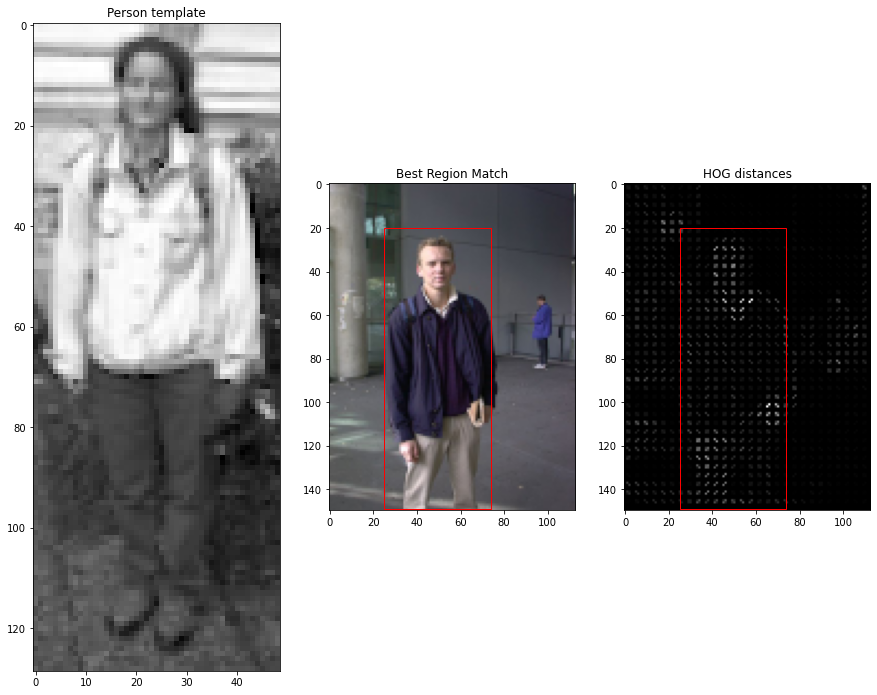

Imatge numero:  9


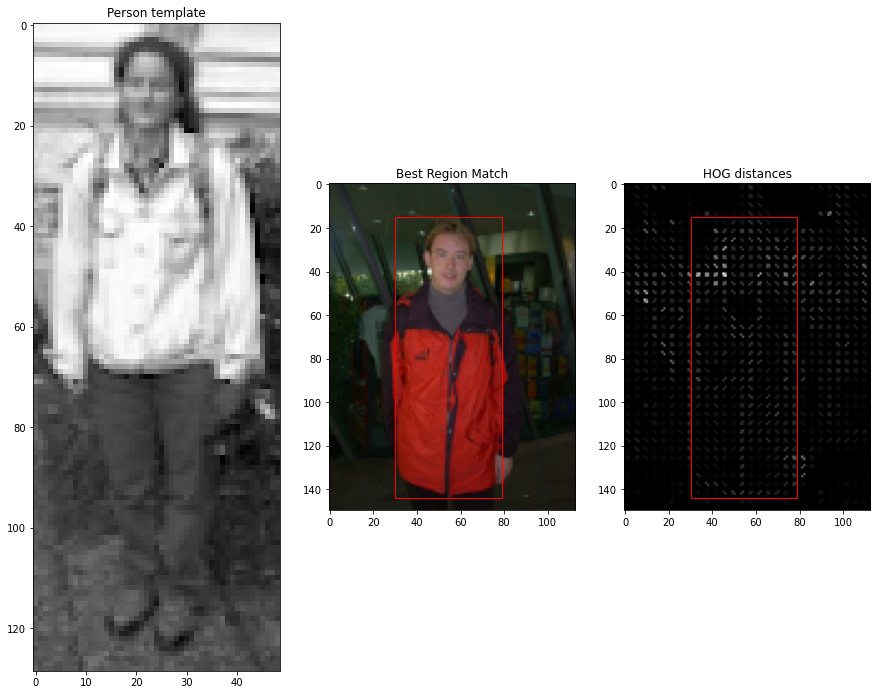

Imatge numero:  10


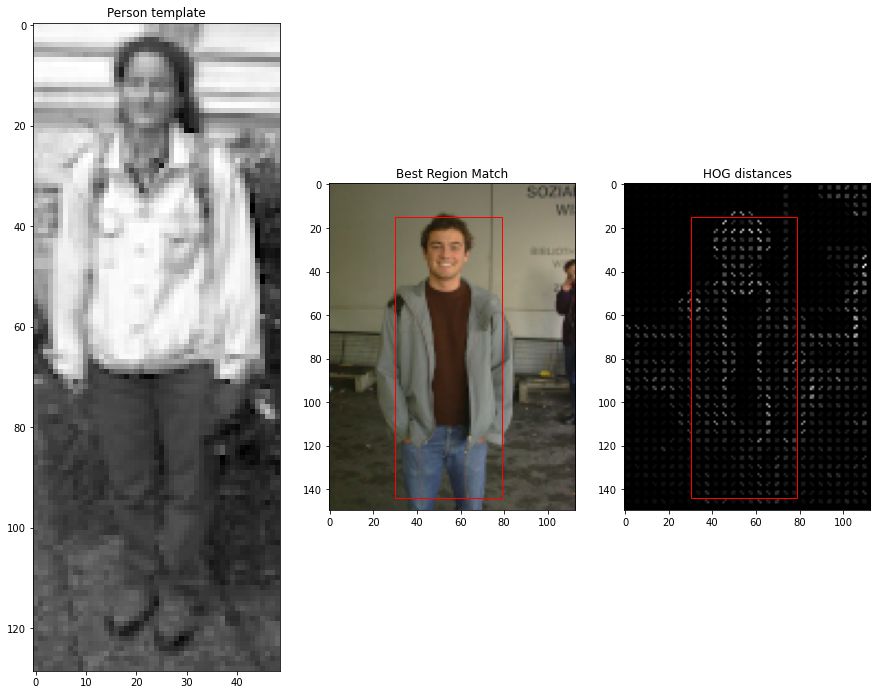

Imatge numero:  11


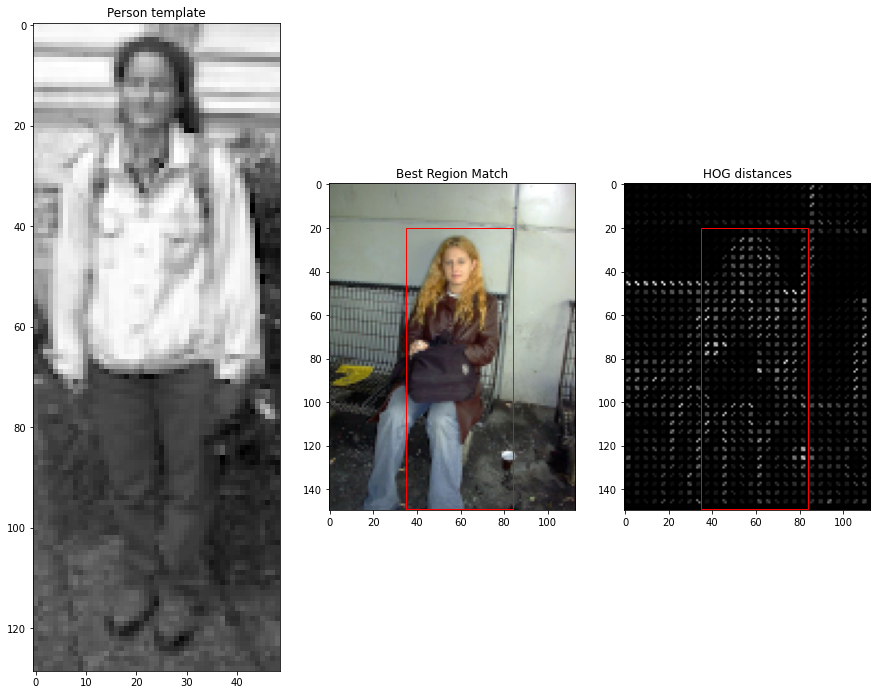

Imatge numero:  12


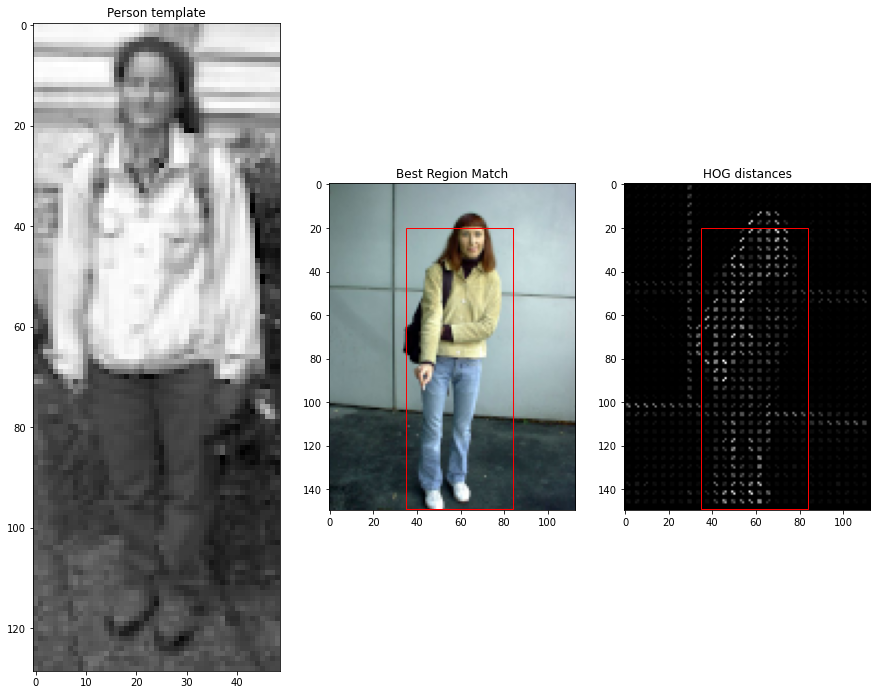

Imatge numero:  13


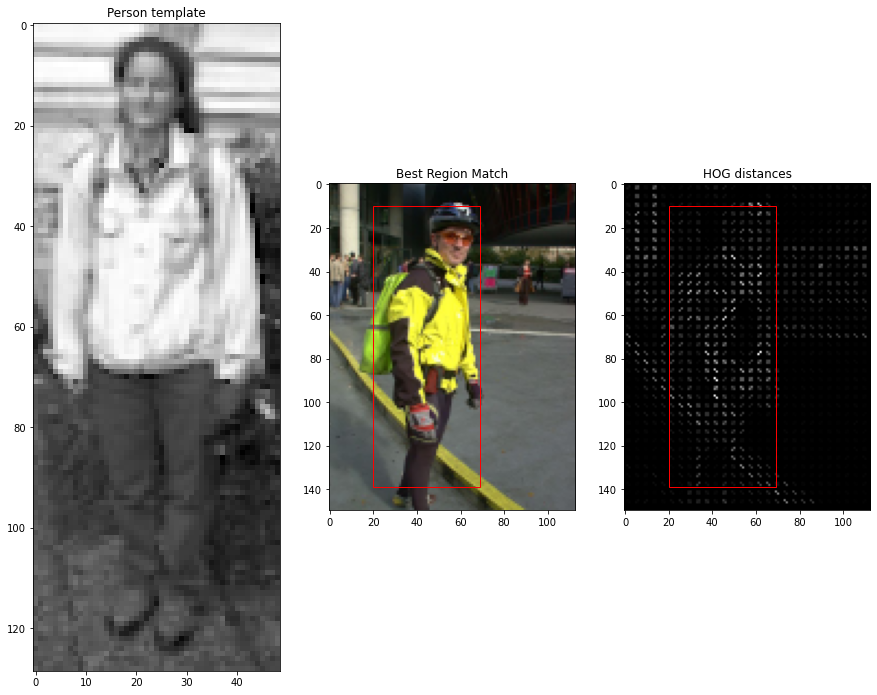

Imatge numero:  14


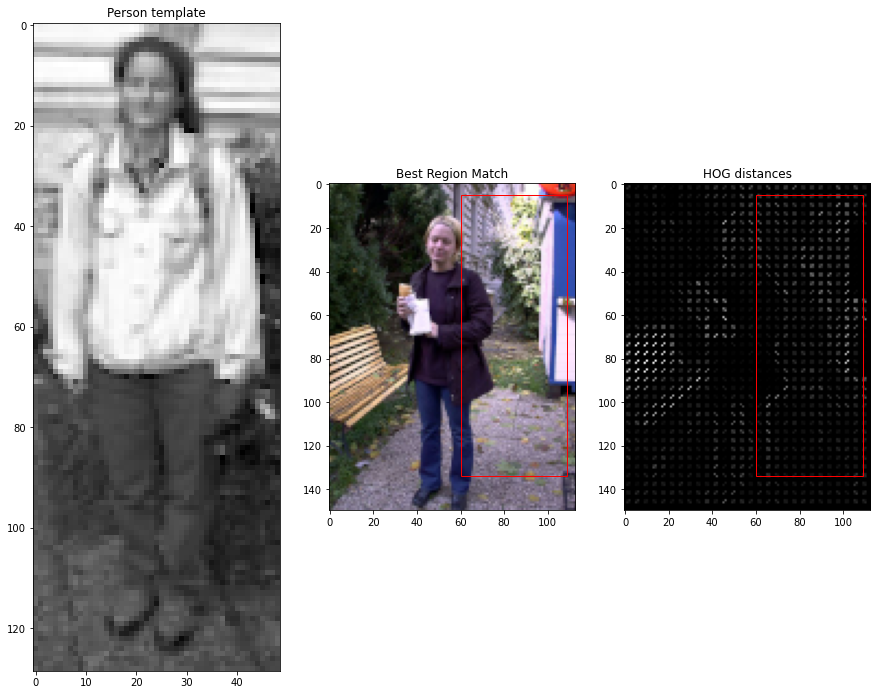

In [91]:
# Your solution here
def getHOG(image):
    img = image.copy()
    img_gray = color.rgb2gray(img)
    img_gray_f = img_as_float(img_gray)
    fd,hogImage = hog(img_gray_f, orientations=8, pixels_per_cell=(4, 4), cells_per_block=(3, 3), visualize=True)
    
    return hogImage

ic = io.ImageCollection('./images/TestPersonImages/*.bmp')
person = io.imread('./images/person_template.bmp')
person = color.rgb2gray(person)
for i,im in enumerate(ic):
    print("Imatge numero: ", i)
    compare(person, im)

Comment the object detection process:
* Please, explain briefly the algorithm, including advantages and disadvantage
* Do you see any advantages of the HOG-based object detector compared to the template-based object detection? (The answer should be up to 10-15 lines).

In [ ]:
# Your solution here

HOG descriptors are used in the HOG algorithm to generate the histogram gradients of the different regions of our image. This histograms are used to identify in which directions the image is changing.

Advantage over other descriptor methods is the HOG descriptor operates on localized cells, the method upholds invariance to geometric and photometric transformations, except for object orientation

For more explanation, HOG is better than the template-based object detection because HOG is not affected by contrast, ilumantion etc.

At the same time, a disadvantage would be that sometimes would not detected objects that are in a different direction of the template

# 3 ORB feature detector and binary descriptor

Let us consider the problem of feature extraction that contains two subproblems: 
- feature location, 
- image feature description.

Let us focus on ORB, an approximation of SIFT method, and analyse if ORB is  scale and rotation invariant, a property that is very important for real-time applications.

**Hint:** `ORB` is a function within the module `skimage.feature`
                             
**Help**: We suggest to have a look at the [ORB example](http://scikit-image.org/docs/dev/auto_examples/features_detection/plot_orb.html) how to compute the ORB descriptors and find the descriptors match. You can use the function match_descriptors from `skimage.feature` module in order to compute and show the similar detected descriptors of the given images. 

**3.1** Detect the censure in the image `starbucks4.jpg`. Analyze and discuss the effect of different values of the parameters in censure function.

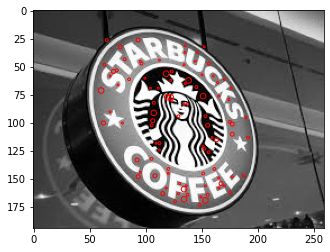

In [22]:
# Your solution here
from skimage import data
from skimage.feature import CENSURE, match_descriptors, ORB, plot_matches

starbucks = io.imread('./images/starbucks4.jpg')
starbucks = color.rgb2gray(starbucks)
detector = CENSURE()
detector.detect(starbucks)
plt.imshow(starbucks, cmap=plt.cm.gray)
plt.scatter(detector.keypoints[:, 1], detector.keypoints[:, 0], 2 ** detector.scales,
facecolors='none', edgecolors='r')


**3.2** Detect the correspondences between the model image `starbucks.jpg` with the scene image `starbucks4.jpg`. You can adapt the code from the [ORB example](http://scikit-image.org/docs/dev/auto_examples/features_detection/plot_orb.html) above. 

Define a function get_ORB implementing the algorithm in order to be able to apply it on different images. Comment the code in detail.

**Hint: If the function plot_matches() gives you an error you can use the plot_matches_aux() at the end of this file.**

Analyze and discuss the effect of different values of the parameter `max_ratio` in the match_descriptors function.


In [23]:
# Your solution here
def get_ORB(img1, img2, n_keypoints):
    img1 = color.rgb2gray(img1)
    img2 = color.rgb2gray(img2)
    img1 = img_as_float(img1)
    img2 = img_as_float(img2)
    
    # Extract descriptors
    descriptor_extractor = ORB(n_keypoints=n_keypoints)
    
    descriptor_extractor.detect_and_extract(img1)
    keypoints1 = descriptor_extractor.keypoints
    descriptors1 = descriptor_extractor.descriptors

    descriptor_extractor.detect_and_extract(img2)
    keypoints2 = descriptor_extractor.keypoints
    descriptors2 = descriptor_extractor.descriptors
    
    # Do the match of descriptors
    matches = match_descriptors(descriptors1, descriptors2, cross_check=True, max_ratio=1.0)
    
    return [img1, img2, keypoints1, keypoints2, matches]

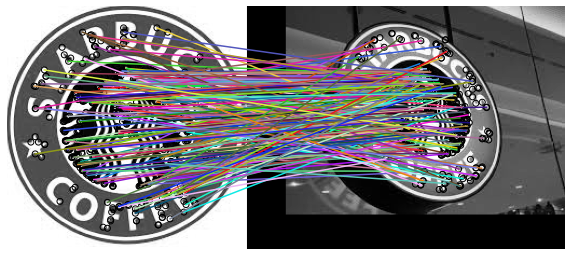

In [24]:
starbucks = io.imread('./images/starbucks.jpg')
starbucksScene = io.imread('./images/starbucks4.jpg')

results = get_ORB(starbucks,starbucksScene,500)
fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(10, 15))
plot_matches(axs, results[0], results[1], results[2], results[3], results[4])
axs.axis('off')
plt.show()


Maximum ratio of distances between first and second closest descriptor in the second set of descriptors. This threshold is useful to filter ambiguous matches between the two descriptor sets. The choice of this value depends on the statistics of the chosen descriptor.

Repeate the experiment comparing the `starbucks.jpg` image as a model, and showing its matches to all Starbucks images, sorting them based on their similarity to the model. Comment when does the algorithm work better. 

<ipython-input-23-59d7db5d2c72>:4: FutureWarning: Non RGB image conversion is now deprecated. For RGBA images, please use rgb2gray(rgba2rgb(rgb)) instead. In version 0.19, a ValueError will be raised if input image last dimension length is not 3.
  img2 = color.rgb2gray(img2)


Similariry:  40.4 %


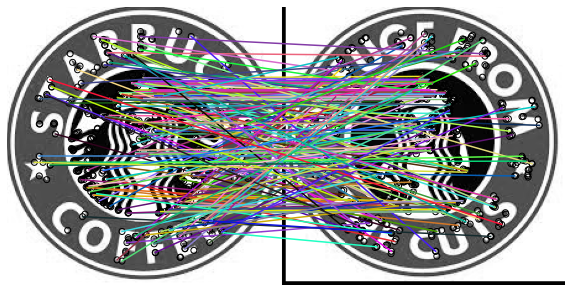

Similariry:  40.0 %


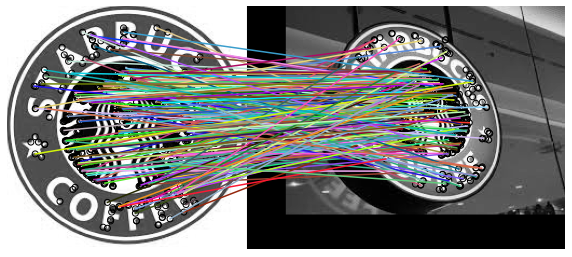

Similariry:  37.0 %


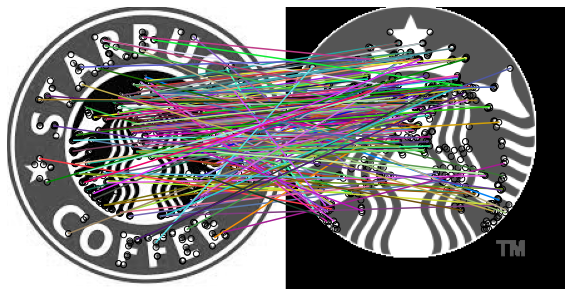

Similariry:  34.2 %


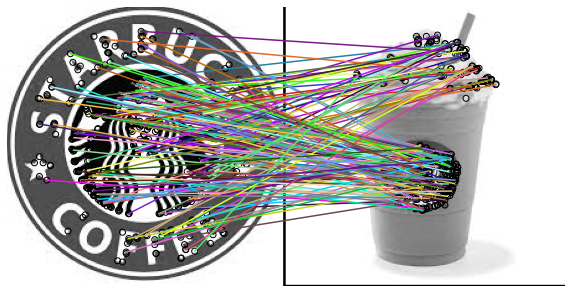

Similariry:  33.0 %


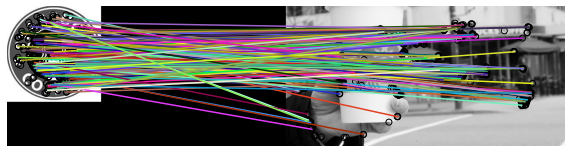

In [25]:
# Your solution here
starbucks = io.imread('./images/starbucks.jpg')
starbucks2 = io.imread('./images/starbucks2.png')
starbucks4 = io.imread('./images/starbucks4.jpg')
starbucks5 = io.imread('./images/starbucks5.png')
starbucks6 = io.imread('./images/starbucks6.jpg')
starbucksCup = io.imread('./images/starbucksCup.jpg')

#PQ to show in order the similarity
q = PriorityQueue()

#Get the ORB data
for image in [starbucks2,starbucks4,starbucks5,starbucks6,starbucksCup]:
    data = get_ORB(starbucks,image,500)
    q.put((-len(data[-1]), data))

# Plot the Images taking into account their similarity
while not q.empty():
    next_item = q.get()
    # Get the similarity in %
    print('Similariry: ', abs(next_item[0]/5), '%')

    data = next_item[1]
    representation, position = plt.subplots(nrows=1, ncols=1, figsize=(10, 15))

    plot_matches(position, data[0], data[1], data[2], data[3], data[4])
    position.axis('off')
    plt.show()

**3.3** Repeate the experiment: 
- Changing the orientation of the model image by rotating it and comparing it with its original version. Help: you can use the rotate() function from skimage.transform 
- Change the scale and orientation of the scene image and compare it with the model image.

**Help:** To do so, you can use the function given below as example:

```
import transform as tf
rotationdegrees = 180
img_rotated = tf.rotate(image2transform, rotationdegrees)
```

or

```
tform = tf.AffineTransform(scale=(1.2, 1.2), translation=(0, -100))
img_transformed = tf.warp(image2transform, tform)
```

Similariry:  99.0 %


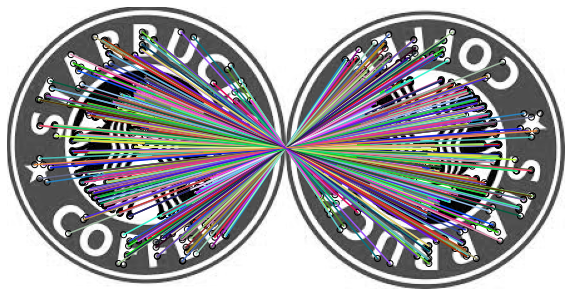

In [26]:
# Your solution here
from skimage import transform

starbucks = io.imread('./images/starbucks.jpg')
rotationdegrees = 180
img_rotated = transform.rotate(starbucks, rotationdegrees)

results = get_ORB(starbucks,img_rotated,500)
print('Similariry: ', abs(len(results[-1])/5), '%')
fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(10, 15))
plot_matches(axs, results[0], results[1], results[2], results[3], results[4])
axs.axis('off')
plt.show()

**(Optional)** Repeat the experiment (3.1 to 3.3) with a new group of images. You could use Coca-Cola advertisements or from another famous brand, easily to find on internet.


In [ ]:
# Your solution here

**3.4** Analysis of the applied techniques and results

- What are the advantages of the ORB object detection with respect to the HOG and template object detector?

- What would happen if you analyse an image that does not contain the Starbucks logo? 

- Could you think of ways of defining a quality measure for the correspondance between two images? (no need of implementing it) 

In [ ]:
# Your solution here

1)The principal advantage is that we can find also by the "context" of the image. So if we are in front of a big announce of Starbucks with some logos of different forms, we can still match it. This also means that ORB is more accurate for detecting the objects.

2)If the image does not contain the logo, it will match with some points in the image that the algorithm finds that are simliar to it.

3)If it's without the %, then we could look at the parameter n_keypoints from the ORB function, this parameter indicate the max number of similars points, if the matches value is more closer to n_keypoints value than another image matches, it means that it has more similarity than the other one, to sum up, the closer to n_keypoints the more similirity they have. 
With this we can define the quality measured.

### Appendix

In [ ]:
# In case the plot_matches() function gives you some problems, you can use the following one:

from skimage.util import img_as_float
import numpy as np

def plot_matches_aux(ax, image1, image2, keypoints1, keypoints2, matches,
                 keypoints_color='k', matches_color=None, only_matches=False):
    """Plot matched features.
    Parameters
    ----------
    ax : matplotlib.axes.Axes
        Matches and image are drawn in this ax.
    image1 : (N, M [, 3]) array
        First grayscale or color image.
    image2 : (N, M [, 3]) array
        Second grayscale or color image.
    keypoints1 : (K1, 2) array
        First keypoint coordinates as ``(row, col)``.
    keypoints2 : (K2, 2) array
        Second keypoint coordinates as ``(row, col)``.
    matches : (Q, 2) array
        Indices of corresponding matches in first and second set of
        descriptors, where ``matches[:, 0]`` denote the indices in the first
        and ``matches[:, 1]`` the indices in the second set of descriptors.
    keypoints_color : matplotlib color, optional
        Color for keypoint locations.
    matches_color : matplotlib color, optional
        Color for lines which connect keypoint matches. By default the
        color is chosen randomly.
    only_matches : bool, optional
        Whether to only plot matches and not plot the keypoint locations.
    """

    image1 = img_as_float(image1)
    image2 = img_as_float(image2)

    new_shape1 = list(image1.shape)
    new_shape2 = list(image2.shape)

    if image1.shape[0] < image2.shape[0]:
        new_shape1[0] = image2.shape[0]
    elif image1.shape[0] > image2.shape[0]:
        new_shape2[0] = image1.shape[0]

    if image1.shape[1] < image2.shape[1]:
        new_shape1[1] = image2.shape[1]
    elif image1.shape[1] > image2.shape[1]:
        new_shape2[1] = image1.shape[1]

    if new_shape1 != image1.shape:
        new_image1 = np.zeros(new_shape1, dtype=image1.dtype)
        new_image1[:image1.shape[0], :image1.shape[1]] = image1
        image1 = new_image1

    if new_shape2 != image2.shape:
        new_image2 = np.zeros(new_shape2, dtype=image2.dtype)
        new_image2[:image2.shape[0], :image2.shape[1]] = image2
        image2 = new_image2

    image = np.concatenate([image1, image2], axis=1)

    offset = image1.shape

    if not only_matches:
        ax.scatter(keypoints1[:, 1], keypoints1[:, 0],
                   facecolors='none', edgecolors=keypoints_color)
        ax.scatter(keypoints2[:, 1] + offset[1], keypoints2[:, 0],
                   facecolors='none', edgecolors=keypoints_color)

    ax.imshow(image, interpolation='nearest', cmap='gray')
    ax.axis((0, 2 * offset[1], offset[0], 0))

    for i in range(matches.shape[0]):
        idx1 = matches[i, 0]
        idx2 = matches[i, 1]

        if matches_color is None:
            color = np.random.rand(3)
        else:
            color = matches_color

        ax.plot((keypoints1[idx1, 1], keypoints2[idx2, 1] + offset[1]),
                (keypoints1[idx1, 0], keypoints2[idx2, 0]),
                '-', color=color)